### Section1

In [ ]:
'''
The task of this project is Exploratory Data Analysis (“EDA”) on the dataset, 
lendind_club_loan_two, from the company, Lending Club. 

LendingClub is a US peer-to-peer lending company.

The dataset contains historical information on loans given out as well as information 
on whether the borrower defaulted (or charged off). 

If we get a new potential customer in the future, we can determine whether or not they will repay the loan. 

Keep this in mind when we evaluate the performance of our model.

Can we build a model that can predict whether or not a borrower will pay back their loan?
This is something to do with going further into regression and machine learning. 
So, I will not deal with it here.

'''

In [ ]:
'''
OVERALL GOAL:

Get an understanding for which variables are important, view summary statistics, and visualize the data.

'''

In [ ]:
'''
<https://medium.com/analytics-vidhya/tutorial-exploratory-data-analysis-eda-with-categorical-variables-6a569a3aea55>

“Most EDA techniques are graphical in nature with a few quantitative techniques. 
The reason for the heavy reliance on graphics is that by its very nature the main role of EDA is to open-mindedly explore, 
and graphics gives the analysts unparalleled power to do so, enticing the data to reveal its structural secrets, 
and being always ready to gain some new, often unsuspected, insight into the data. 
In combination with the natural pattern-recognition capabilities that we all possess, graphics provides, 
of course, unparalleled power to carry this out.”

'''

In [19]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


In [20]:
# Import CSV
lending_loan_df = pd.read_csv('lending_club_loan_two.csv')

In [21]:
lending_loan_df.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
0,10000.0,36 months,11.44,329.48,B,B4,Marketing,10+ years,RENT,117000.0,...,16.0,0.0,36369.0,41.8,25.0,w,INDIVIDUAL,0.0,0.0,"0174 Michelle Gateway\r\nMendozaberg, OK 22690"
1,8000.0,36 months,11.99,265.68,B,B5,Credit analyst,4 years,MORTGAGE,65000.0,...,17.0,0.0,20131.0,53.3,27.0,f,INDIVIDUAL,3.0,0.0,"1076 Carney Fort Apt. 347\r\nLoganmouth, SD 05113"
2,15600.0,36 months,10.49,506.97,B,B3,Statistician,< 1 year,RENT,43057.0,...,13.0,0.0,11987.0,92.2,26.0,f,INDIVIDUAL,0.0,0.0,"87025 Mark Dale Apt. 269\r\nNew Sabrina, WV 05113"
3,7200.0,36 months,6.49,220.65,A,A2,Client Advocate,6 years,RENT,54000.0,...,6.0,0.0,5472.0,21.5,13.0,f,INDIVIDUAL,0.0,0.0,"823 Reid Ford\r\nDelacruzside, MA 00813"
4,24375.0,60 months,17.27,609.33,C,C5,Destiny Management Inc.,9 years,MORTGAGE,55000.0,...,13.0,0.0,24584.0,69.8,43.0,f,INDIVIDUAL,1.0,0.0,"679 Luna Roads\r\nGreggshire, VA 11650"


In [22]:
lending_loan_df.shape

(396030, 27)

In [23]:
lending_loan_df.columns

Index(['loan_amnt', 'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       'emp_title', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'purpose', 'title',
       'dti', 'earliest_cr_line', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'initial_list_status', 'application_type',
       'mort_acc', 'pub_rec_bankruptcies', 'address'],
      dtype='object')

In [ ]:
'''
loan_amnt   float64
The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.

Term   object
The number of payments on the loan. Values are in months and can be either 36 or 60.

int_rate   float64
Interest Rate on the loan

Instalment   float64
The monthly payment owed by the borrower if the loan originates.

grade
LC assigned loan grade

sub_grade
LC assigned loan subgrade

emp_title
The job title supplied by the Borrower when applying for the loan.*

emp_length
Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years.

home_ownership
The home ownership status provided by the borrower during registration or obtained from the credit report. Our values are: RENT, OWN, MORTGAGE, OTHER

annual_inc   float64
The self-reported annual income provided by the borrower during registration.

verification_status
Indicates if income was verified by LC, not verified, or if the income source was verified

issue_d
The month which the loan was funded

loan_status
Current status of the loan

purpose
A category provided by the borrower for the loan request.


title
The loan title provided by the borrower

dti   float64
A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.

The lower dti, the better for customers their credit score! 

earliest_cr_line
The month the borrower's earliest reported credit line was opened

open_acc   float64
The number of open credit lines in the borrower's credit file.

pub_rec   float64
Number of derogatory public records

revol_bal   float64
Total credit revolving balance

revol_util   float64
Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.

total_acc   float64
The total number of credit lines currently in the borrower's credit file

initial_list_status
The initial listing status of the loan. Possible values are – W, F

application_type
Indicates whether the loan is an individual application or a joint application with two co-borrowers

mort_acc   float64
Number of mortgage accounts.

pub_rec_bankruptcies   float64
Number of public record bankruptcies

Address:   object

zip_code
The first 3 numbers of the zip code provided by the borrower in the loan application.

addr_state
The state provided by the borrower in the loan application


'''

In [24]:
lending_loan_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   loan_amnt             396030 non-null  float64
 1   term                  396030 non-null  object 
 2   int_rate              396030 non-null  float64
 3   installment           396030 non-null  float64
 4   grade                 396030 non-null  object 
 5   sub_grade             396030 non-null  object 
 6   emp_title             373103 non-null  object 
 7   emp_length            377729 non-null  object 
 8   home_ownership        396030 non-null  object 
 9   annual_inc            396030 non-null  float64
 10  verification_status   396030 non-null  object 
 11  issue_d               396030 non-null  object 
 12  loan_status           396030 non-null  object 
 13  purpose               396030 non-null  object 
 14  title                 394275 non-null  object 
 15  

In [ ]:
'''
The dataset has 396039 rows and 27 columns, of which 12 columns are numeric variables and 15, categorical variables.

'''

In [25]:
# Check no more rows with missing values
lending_loan_df.isnull().sum()

loan_amnt                   0
term                        0
int_rate                    0
installment                 0
grade                       0
sub_grade                   0
emp_title               22927
emp_length              18301
home_ownership              0
annual_inc                  0
verification_status         0
issue_d                     0
loan_status                 0
purpose                     0
title                    1755
dti                         0
earliest_cr_line            0
open_acc                    0
pub_rec                     0
revol_bal                   0
revol_util                276
total_acc                   0
initial_list_status         0
application_type            0
mort_acc                37795
pub_rec_bankruptcies      535
address                     0
dtype: int64

In [ ]:
'''
As you can see there are missing values with employment title, employment length, title, 
revolving line utilisation rate, mortgage account, and public record bankruptcies. 

'''

In [7]:
# to visualize missing values
!pip install missingno 

In [8]:
import missingno as msno

<AxesSubplot:>

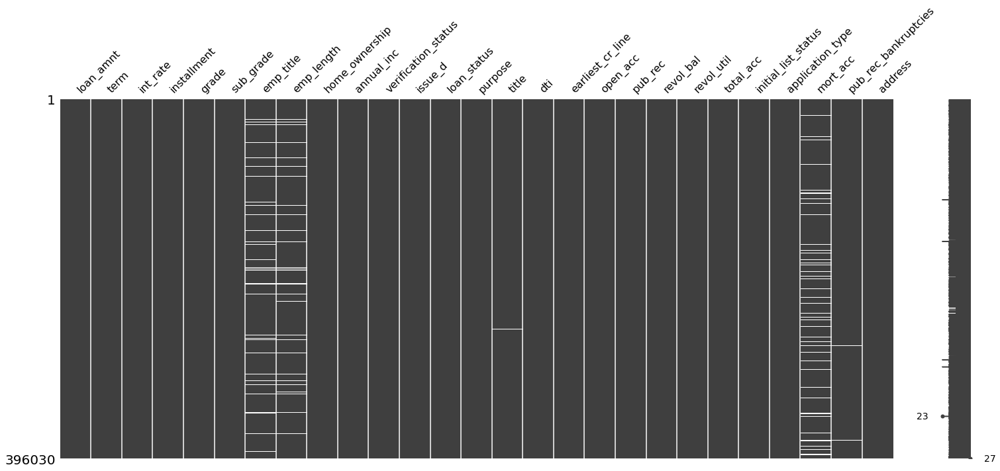

In [9]:
msno.matrix(lending_loan_df)

In [ ]:
'''
This shows employment title, employment length, and mortgage account have a lot more missing values than the other three. 
Even though you can’t see it clearly about revolving line utilisation rate 
because its missing values are much smaller than the other two.

'''

In [10]:
# Statistics summary of numerical varibales or columns

lending_loan_df.describe()

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies
count,396030.000000,396030.000000,396030.000000,3.960300e+05,396030.000000,396030.000000,396030.000000,3.960300e+05,395754.000000,396030.000000,358235.000000,395495.000000
mean,14113.888089,13.639400,431.849698,7.420318e+04,17.379514,11.311153,0.178191,1.584454e+04,53.791749,25.414744,1.813991,0.121648
std,8357.441341,4.472157,250.727790,6.163762e+04,18.019092,5.137649,0.530671,2.059184e+04,24.452193,11.886991,2.147930,0.356174
min,500.000000,5.320000,16.080000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,2.000000,0.000000,0.000000
25%,8000.000000,10.490000,250.330000,4.500000e+04,11.280000,8.000000,0.000000,6.025000e+03,35.800000,17.000000,0.000000,0.000000
50%,12000.000000,13.330000,375.430000,6.400000e+04,16.910000,10.000000,0.000000,1.118100e+04,54.800000,24.000000,1.000000,0.000000
75%,20000.000000,16.490000,567.300000,9.000000e+04,22.980000,14.000000,0.000000,1.962000e+04,72.900000,32.000000,3.000000,0.000000
max,40000.000000,30.990000,1533.810000,8.706582e+06,9999.000000,90.000000,86.000000,1.743266e+06,892.300000,151.000000,34.000000,8.000000


In [11]:
lending_loan_df.corr()

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies
loan_amnt,1.000000,0.168921,0.953929,0.336887,0.016636,0.198556,-0.077779,0.328320,0.099911,0.223886,0.222315,-0.106539
int_rate,0.168921,1.000000,0.162758,-0.056771,0.079038,0.011649,0.060986,-0.011280,0.293659,-0.036404,-0.082583,0.057450
installment,0.953929,0.162758,1.000000,0.330381,0.015786,0.188973,-0.067892,0.316455,0.123915,0.202430,0.193694,-0.098628
annual_inc,0.336887,-0.056771,0.330381,1.000000,-0.081685,0.136150,-0.013720,0.299773,0.027871,0.193023,0.236320,-0.050162
dti,0.016636,0.079038,0.015786,-0.081685,1.000000,0.136181,-0.017639,0.063571,0.088375,0.102128,-0.025439,-0.014558
open_acc,0.198556,0.011649,0.188973,0.136150,0.136181,1.000000,-0.018392,0.221192,-0.131420,0.680728,0.109205,-0.027732
pub_rec,-0.077779,0.060986,-0.067892,-0.013720,-0.017639,-0.018392,1.000000,-0.101664,-0.075910,0.019723,0.011552,0.699408
revol_bal,0.328320,-0.011280,0.316455,0.299773,0.063571,0.221192,-0.101664,1.000000,0.226346,0.191616,0.194925,-0.124532
revol_util,0.099911,0.293659,0.123915,0.027871,0.088375,-0.131420,-0.075910,0.226346,1.000000,-0.104273,0.007514,-0.086751
total_acc,0.223886,-0.036404,0.202430,0.193023,0.102128,0.680728,0.019723,0.191616,-0.104273,1.000000,0.381072,0.042035


In [ ]:
# Take too long so I forced it to stop

#sns.pairplot(lending_loan_df, hue="loan_status", diag_kind="hist")

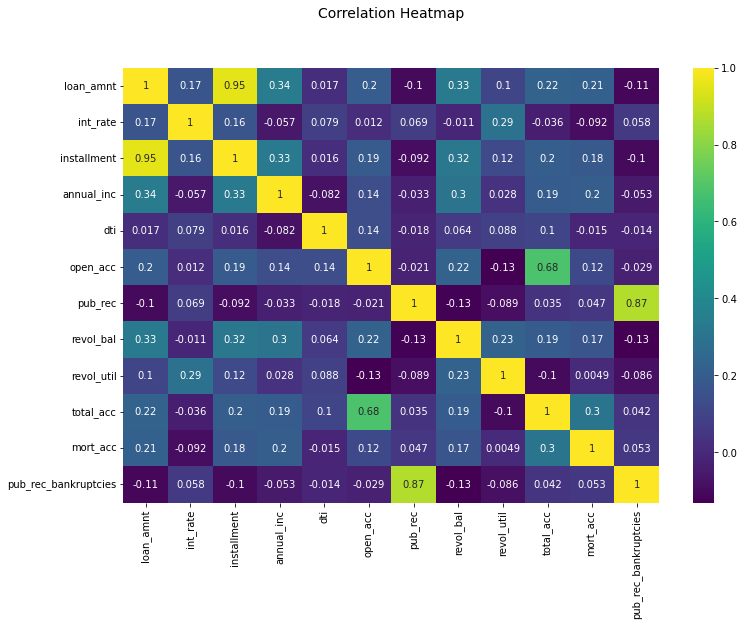

In [84]:
# Heatmap
plt.figure(figsize=(12, 8))
heatmap = sns.heatmap(lending_loan_df.corr(), annot=True, cmap='viridis')

# Plot correlation heatmap.
# We can understand better visually about the correlation of any two columns.

heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':14}, pad=50)

In [ ]:
'''
The correlation heatmap of the dataset shows there are very strong linear relationship between loan amount and instalment, 
the coefficient of correlation 0.95. 

Also, there are good linear relationships between open account and total account, 0.68, 
and between public records and number of public record bankruptcies, which make sense because each pair is closely related.

'''

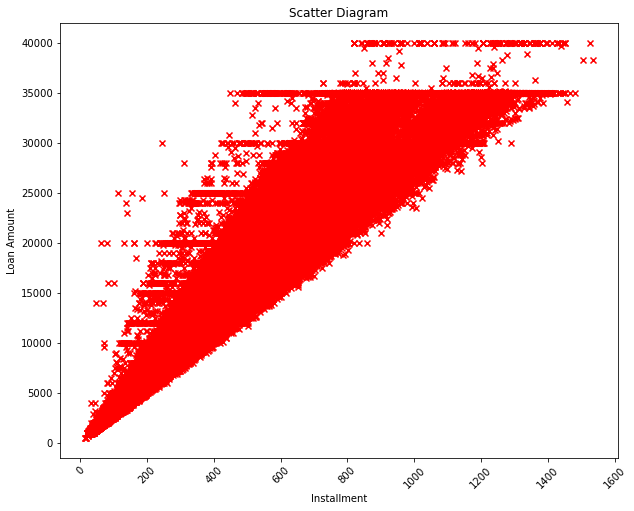

In [20]:
# Draw the scatter diagram

plt.figure(figsize=(10, 8))

plt.scatter(lending_loan_df.installment, lending_loan_df.loan_amnt, marker='x', color='red') # Second series plotted will be red crosses

# Add X Label on X-axis
plt.xlabel("Installment")

# Add Y Label on X-axis
plt.ylabel("Loan Amount")

# Add title to graph
plt.title("Scatter Diagram")

# rotate x label for clear visualization
plt.xticks(rotation=45)

# Show the plot
plt.show()

In [ ]:
'''
The scatter diagram shows it.
'''

In [26]:
pip install pandas-profiling[notebook]

In [27]:
from pandas_profiling import ProfileReport

prof = ProfileReport(lending_loan_df)

In [28]:
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
'''
I ran profile report on the dataset and found 27 columns or variables or 26 features + 1 target attribute, 
of which 12 numeric variables and 15 categorical variables.

It shows the total number of observations or data points is 396030.
Not so big a dataset for Machine Learning.

No duplicate rows and 81589 missing cells, which is about 0.8% of the total rows. 

'''

In [13]:
lending_loan_df.loan_status.head(10)

0     Fully Paid
1     Fully Paid
2     Fully Paid
3     Fully Paid
4    Charged Off
5     Fully Paid
6     Fully Paid
7     Fully Paid
8     Fully Paid
9     Fully Paid
Name: loan_status, dtype: object

In [14]:
lending_loan_df.loan_status.value_counts()

Fully Paid     318357
Charged Off     77673
Name: loan_status, dtype: int64

In [ ]:
'''
The "loan_status" column contains label.  
That is, the target variable or prediction, which are ‘Fully Paid’ or ‘Charged Off’ = defaulted.

'''

In [14]:
318357 + 77673

396030

In [17]:
77673/(77673 + 318357)*100

19.61290811302174

In [ ]:
'''
The proportion of Charged Off of the total data points is 19.6%.
'''

<AxesSubplot:title={'center':'Bar Plot of Loan Status Counts'}, xlabel='Count', ylabel='Loan Status'>

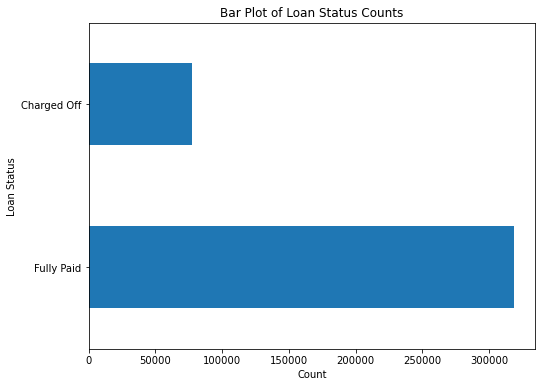

In [15]:
# Bar plot

plt.figure(figsize=(8, 6))

# Add x Label on x-axis
plt.xlabel("Count")

# Add y Label on y-axis
plt.ylabel("Loan Status")

# Add a title to graph
plt.title("Bar Plot of Loan Status Counts")

lending_loan_df['loan_status'].value_counts().plot(kind='barh')

In [ ]:
'''
You can see the difference between Fully Paid and Charged Off categories.

'''

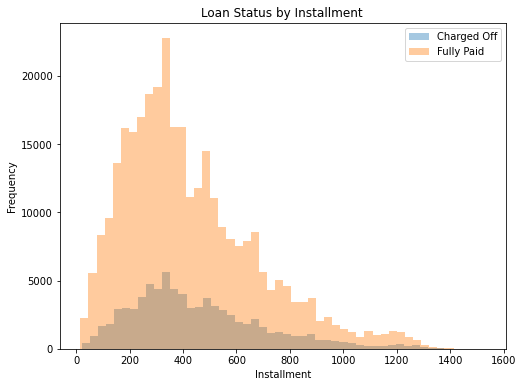

In [18]:
# Jin

# Stacked Histograms

plt.figure(figsize=(8, 6))

plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'installment'], label = 'Charged Off', 
         alpha=0.4, bins=50)
plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'installment'], label = 'Fully Paid', 
         alpha=0.4, bins=50)

plt.legend()

# Label axes
_ = plt.xlabel('Installment')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status by Installment ')

In [32]:
# Checking
lending_loan_df.installment.value_counts().max()

968

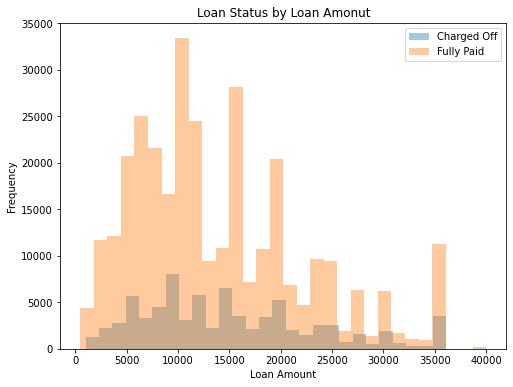

In [19]:
# Stacked Histograms

plt.figure(figsize=(8, 6))

plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'loan_amnt'], label = 'Charged Off', 
         alpha=0.4, bins=30)
plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'loan_amnt'], label = 'Fully Paid', 
         alpha=0.4, bins=30)

plt.legend()

# Label axes
_ = plt.xlabel('Loan Amount')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status by Loan Amonut')

In [10]:
lending_loan_df.groupby('loan_status')['loan_amnt'].describe()

,count,mean,std,min,25%,50%,75%,max
loan_status,,,,,,,,
Charged Off,77673.0,15126.300967,8505.090557,1000.0,8525.0,14000.0,20000.0,40000.0
Fully Paid,318357.0,13866.878771,8302.319699,500.0,7500.0,12000.0,19225.0,40000.0


In [ ]:
'''
Grade & Sub_grade

grade: LendingClub assigned loan grade
sub_grade: LC assigned loan subgrade

Let's explore the Grade and SubGrade columns that LendingClub attributes to the loans.

What are the unique possible grade & sub_grade?

'''

In [8]:
print(f'Grade unique: {lending_loan_df.grade.unique()}')

Grade unique: ['B' 'A' 'C' 'E' 'D' 'F' 'G']


In [9]:
print(f'Sub-Grade unique: {lending_loan_df.sub_grade.unique()}')

Sub-Grade unique: ['B4' 'B5' 'B3' 'A2' 'C5' 'C3' 'A1' 'B2' 'C1' 'A5' 'E4' 'A4' 'A3' 'D1'
 'C2' 'B1' 'D3' 'D5' 'D2' 'E1' 'E2' 'E5' 'F4' 'E3' 'D4' 'G1' 'F5' 'G2'
 'C4' 'F1' 'F3' 'G5' 'G4' 'F2' 'G3']


B    101431
C     83538
A     60151
D     45186
E     19723
F      6735
G      1593
Name: grade, dtype: int64

C    22449
D    18338
B    14587
E    11765
F     5037
A     4036
G     1461
Name: grade, dtype: int64


<Figure size 720x576 with 0 Axes>

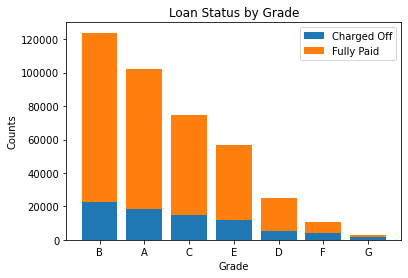

In [27]:
#from matplotlib import pyplot as plt

fully_paid = lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'grade'].value_counts()
print(fully_paid)
print()

charged_off = lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'grade'].value_counts()
print(charged_off)

plt.figure(figsize=(10, 8))

fig, ax = plt.subplots()

ax.bar(lending_loan_df.grade.unique(), 
       charged_off, label='Charged Off')

ax.bar(lending_loan_df.grade.unique(),
       fully_paid, bottom=charged_off, label='Fully Paid')

ax.set_xlabel('Grade')
ax.set_ylabel('Counts')
ax.set_title('Loan Status by Grade')

ax.legend()

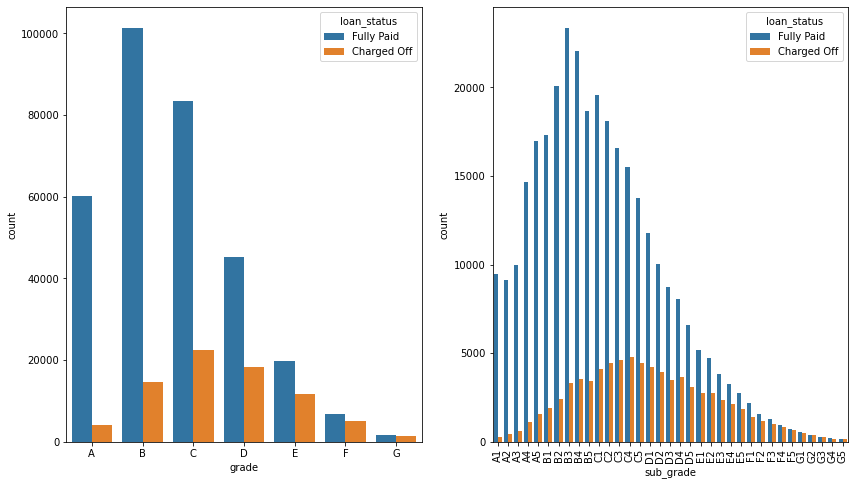

In [44]:
plt.figure(figsize=(14, 8))

plt.subplot(1, 2, 1)
grade = sorted(lending_loan_df.grade.unique().tolist())
#print(grade)

sns.countplot(x='grade', data=lending_loan_df, hue='loan_status', order=grade)

plt.subplot(1, 2, 2)
sub_grade = sorted(lending_loan_df.sub_grade.unique().tolist())
#print(sub_grade)

g = sns.countplot(x='sub_grade', data=lending_loan_df, hue='loan_status', order=sub_grade)
g.set_xticklabels(g.get_xticklabels(), rotation=90);

In [ ]:
'''
It looks like F and G subgrades don't get paid back that often. 
Isloate those and recreate the countplot just for those subgrades.

'''

['F', 'G']
['F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5']


<AxesSubplot:xlabel='sub_grade', ylabel='count'>

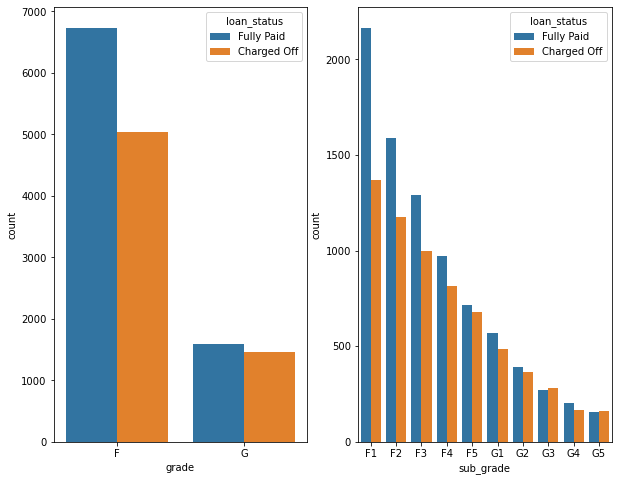

In [45]:
df = lending_loan_df[(lending_loan_df.grade == 'F') | (lending_loan_df.grade == 'G')]

plt.figure(figsize=(10, 8))

plt.subplot(1, 2, 1)
grade = sorted(df.grade.unique().tolist())
print(grade)

sns.countplot(x='grade', data=df, hue='loan_status', order=grade)

plt.subplot(1, 2, 2)
sub_grade = sorted(df.sub_grade.unique().tolist())
print(sub_grade)

sns.countplot(x='sub_grade', data=df, hue='loan_status', order=sub_grade)

In [ ]:
'''
Term, Home Ownership, Verification Status & Purpose

term: The number of payments on the loan. 
Values are in months and can be either 36 or 60.

home_ownership: The home ownership status provided by the borrower during registration or obtained from the credit report. 
Our values are: RENT, OWN, MORTGAGE, OTHER

verification_status: Indicates if income was verified by LC, not verified, or if the income source was verified

purpose: A category provided by the borrower for the loan request.

'''

In [8]:
lending_loan_df['home_ownership'].value_counts()

MORTGAGE    198348
RENT        159790
OWN          37746
OTHER          112
NONE            31
ANY              3
Name: home_ownership, dtype: int64

In [30]:
lending_loan_df.home_ownership.unique()

array(['RENT', 'MORTGAGE', 'OWN', 'OTHER', 'NONE', 'ANY'], dtype=object)

MORTGAGE    164716
RENT        123578
OWN          29940
OTHER           96
NONE            24
ANY              3
Name: home_ownership, dtype: int64

RENT        36212
MORTGAGE    33632
OWN          7806
OTHER          16
NONE            7
Name: home_ownership, dtype: int64
<class 'pandas.core.series.Series'>

0    36212
1    33632
2     7806
3       16
4        7
5        0
dtype: int64


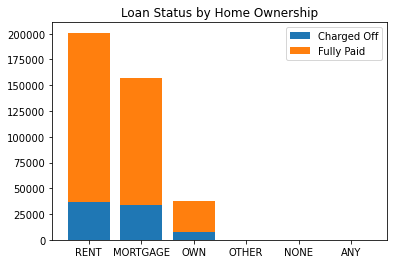

<Figure size 1440x1296 with 0 Axes>

In [27]:
#from matplotlib import pyplot as plt

fully_paid = lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'home_ownership'].value_counts()
print(fully_paid)
print()

charged_off = lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'home_ownership'].value_counts()
print(charged_off)
print(type(charged_off))
print()

df2 = pd.Series({'ANY': 0})
charged_off = charged_off.append(df2, ignore_index = True)
print(charged_off)

fig, ax = plt.subplots()

# changing the size of figure to 2X2
plt.figure(figsize=(20, 18))

ax.bar(lending_loan_df.home_ownership.unique(), 
       charged_off, label='Charged Off')

ax.bar(lending_loan_df.home_ownership.unique(),
       fully_paid, bottom=charged_off, label='Fully Paid')

ax.set_title('Loan Status by Home Ownership')

ax.legend()

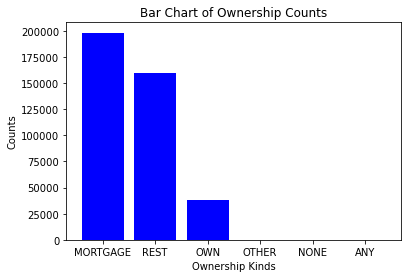

In [34]:
# Bar plot

ownership_kinds = ['MORTGAGE', 'REST', 'OWN', 'OTHER', 'NONE', 'ANY']

# Plot the data
plt.bar(ownership_kinds, lending_loan_df.home_ownership.value_counts(), color='blue')

# Add X Label on X-axis
plt.xlabel("Ownership Kinds")

# Add X Label on X-axis
plt.ylabel("Counts")

# Add a title to graph
plt.title("Bar Chart of Ownership Counts")

# Show the plot
plt.show()

In [35]:
lending_loan_df.loc[(lending_loan_df.home_ownership == 'ANY') | (lending_loan_df.home_ownership == 'NONE'),
                    'home_ownership'] = 'OTHER'  

lending_loan_df.home_ownership.value_counts()

MORTGAGE    198348
RENT        159790
OWN          37746
OTHER          146
Name: home_ownership, dtype: int64

[Text(0, 0, 'vacation'),
 Text(1, 0, 'debt_consolidation'),
 Text(2, 0, 'credit_card'),
 Text(3, 0, 'home_improvement'),
 Text(4, 0, 'small_business'),
 Text(5, 0, 'major_purchase'),
 Text(6, 0, 'other'),
 Text(7, 0, 'medical'),
 Text(8, 0, 'wedding'),
 Text(9, 0, 'car'),
 Text(10, 0, 'moving'),
 Text(11, 0, 'house'),
 Text(12, 0, 'educational'),
 Text(13, 0, 'renewable_energy')]

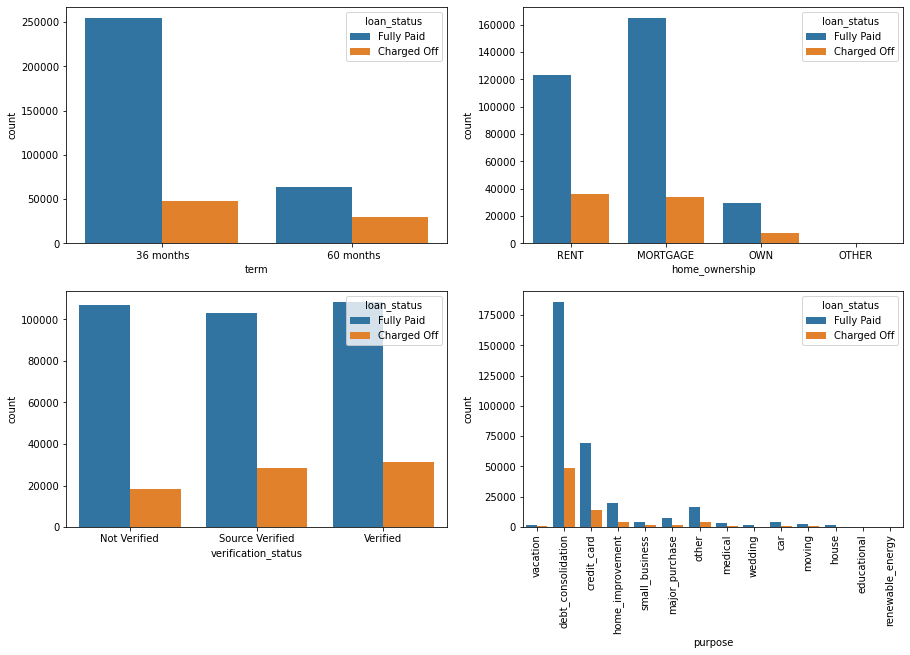

In [36]:
plt.figure(figsize=(15, 20))

plt.subplot(4, 2, 1)
sns.countplot(x='term', data=lending_loan_df, hue='loan_status')

plt.subplot(4, 2, 2)
sns.countplot(x='home_ownership', data=lending_loan_df, hue='loan_status')

plt.subplot(4, 2, 3)
sns.countplot(x='verification_status', data=lending_loan_df, hue='loan_status')

plt.subplot(4, 2, 4)
g = sns.countplot(x='purpose', data=lending_loan_df, hue='loan_status')
g.set_xticklabels(g.get_xticklabels(), rotation=90)

In [37]:
lending_loan_df.loc[lending_loan_df['home_ownership']=='OTHER', 'loan_status'].value_counts()

Fully Paid     123
Charged Off     23
Name: loan_status, dtype: int64

In [ ]:
'''
Interest Rate & Annual Income

int_rate: Interest Rate on the loan

annual_inc: The self-reported annual income provided by the borrower during registration

'''

In [39]:
lending_loan_df.int_rate.value_counts()

10.99    12411
12.99     9632
15.61     9350
11.99     8582
8.90      8019
         ...  
14.28        1
18.72        1
18.36        1
30.84        1
24.59        1
Name: int_rate, Length: 566, dtype: int64

In [41]:
# PK: Both lengths are equal!

len(lending_loan_df.int_rate.unique())

566

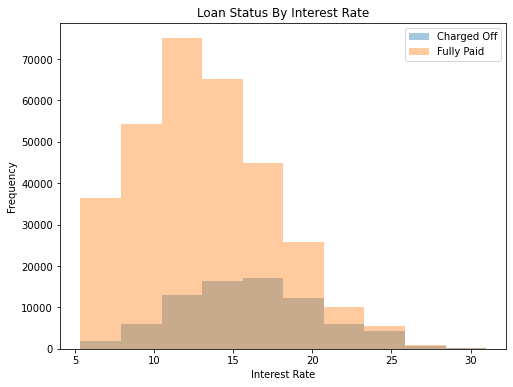

In [49]:
# Loan Status By Interest Rate
plt.figure(figsize=(8, 6))
           
plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'int_rate'], label = 'Charged Off', alpha=0.4)
plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'int_rate'], label = 'Fully Paid', alpha=0.4)
plt.legend()

# Label axes
_ = plt.xlabel('Interest Rate')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status By Interest Rate')

In [ ]:
'''
It seems that loans with high interest rate are more likely to be unpaid.

'''

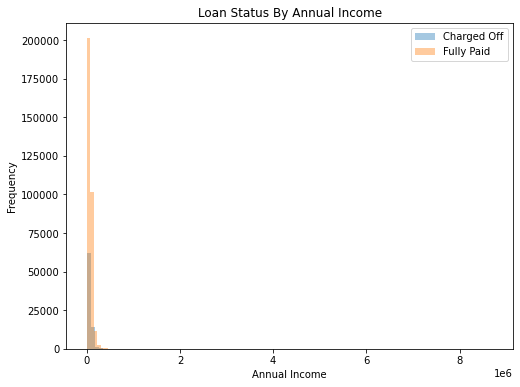

In [6]:
# Loan Status By Annual Income
plt.figure(figsize=(8, 6))
           
plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'annual_inc'], label = 'Charged Off', 
         alpha=0.4, bins=100)
plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'annual_inc'], label = 'Fully Paid', 
         alpha=0.4, bins=100)
plt.legend()

# Label axes
_ = plt.xlabel('Annual Income')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status By Annual Income')

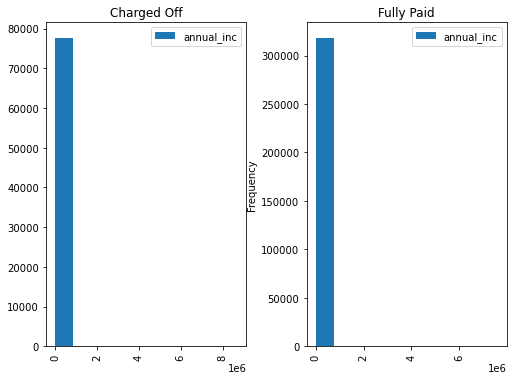

In [31]:
# Label axes
lending_loan_df.hist(column='annual_inc', by='loan_status', legend=True, figsize=(8,6))

plt.ylabel('Frequency')

plt.show()

In [21]:
# only Annual income <= 250000

lending_loan_df['annual_inc_ed'] = lending_loan_df['annual_inc'].apply(lambda x: 0 if x > 250000 else x)

In [26]:
lending_loan_df.annual_inc.value_counts(sort=True)

60000.00    15313
50000.00    13303
65000.00    11333
70000.00    10674
40000.00    10629
            ...  
72179.00        1
50416.00        1
46820.80        1
10368.00        1
31789.88        1
Name: annual_inc, Length: 27197, dtype: int64

In [29]:
lending_loan_df.annual_inc.describe()

count    3.960300e+05
mean     7.420318e+04
std      6.163762e+04
min      0.000000e+00
25%      4.500000e+04
50%      6.400000e+04
75%      9.000000e+04
max      8.706582e+06
Name: annual_inc, dtype: float64

In [27]:
len(lending_loan_df.annual_inc)

396030

In [23]:
lending_loan_df.annual_inc_ed.value_counts()

60000.00    15313
50000.00    13303
65000.00    11333
70000.00    10674
40000.00    10629
            ...  
65493.00        1
96921.00        1
39353.00        1
30876.00        1
31789.88        1
Name: annual_inc_ed, Length: 26758, dtype: int64

In [28]:
len(lending_loan_df.annual_inc_ed)

396030

In [30]:
lending_loan_df.annual_inc_ed.describe()

count    396030.000000
mean      70823.178480
std       37659.871428
min           0.000000
25%       45000.000000
50%       63000.000000
75%       88000.000000
max      250000.000000
Name: annual_inc_ed, dtype: float64

In [35]:
len(lending_loan_df[lending_loan_df.annual_inc <= 250000])

392733

In [36]:
396030 - 392733 

3297

In [8]:
lending_loan_df[lending_loan_df.annual_inc > 250000].head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address,annual_inc_ed
228,35000.0,36 months,12.99,1179.12,C,C2,Lawyer Partner,10+ years,MORTGAGE,350000.0,...,0.0,216194.0,45.4,43.0,w,INDIVIDUAL,2.0,0.0,90980 Melissa Cliffs Suite 259\r\nPort Angelic...,0.0
286,21000.0,36 months,6.03,639.15,A,A1,Toyota Tsusho,10+ years,OWN,495000.0,...,0.0,0.0,0.0,26.0,w,INDIVIDUAL,2.0,0.0,"6883 Miller Square\r\nValdezburgh, CT 29597",0.0
381,15000.0,36 months,18.85,548.71,D,D3,California Travel and Tourism Commission,5 years,MORTGAGE,260000.0,...,0.0,46675.0,38.3,34.0,f,INDIVIDUAL,9.0,0.0,"33146 Flores Shoals\r\nMichaelfort, SC 22690",0.0
519,10000.0,36 months,17.27,357.88,C,C5,Trinity Mother Frances Clinics,1 year,RENT,475000.0,...,0.0,7210.0,48.7,17.0,w,INDIVIDUAL,1.0,0.0,"221 Hensley Walks\r\nPort Richard, NY 30723",0.0
722,35000.0,60 months,20.49,936.86,E,E1,Willis Group,10+ years,RENT,280000.0,...,0.0,32651.0,81.8,31.0,f,INDIVIDUAL,1.0,0.0,"723 Michael Shores Suite 386\r\nPort John, MT ...",0.0


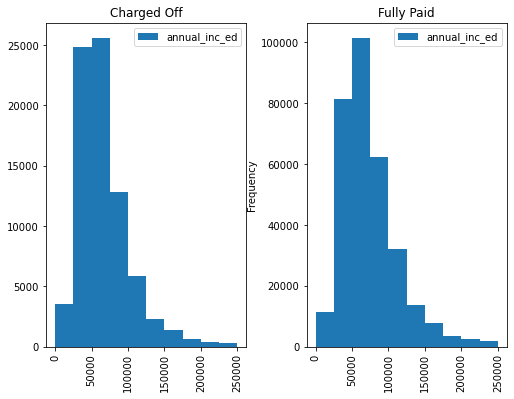

In [6]:
# PK: Alternative unstacked way

# Keep this plot!

# Label axes
lending_loan_df.hist(column='annual_inc_ed', by='loan_status', legend=True, figsize=(8,6))
#lending_loan_df.hist(column='installment', by='loan_status', sharex=True, sharey=True)  # Not good

plt.ylabel('Frequency')

plt.show()

In [12]:
lending_loan_df.annual_inc_ed.unique()

array([117000.  ,  65000.  ,  43057.  , ...,  36111.  ,  47212.  ,
        31789.88])

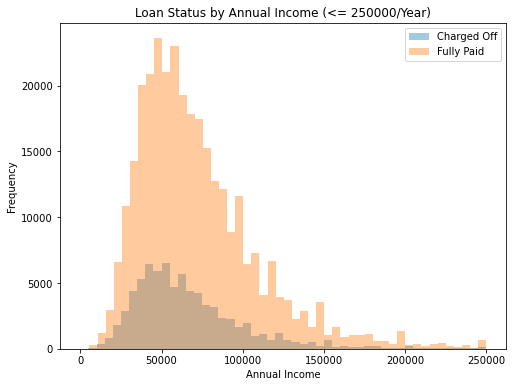

In [9]:
# Loan Status by Annual Income (<= 250000/Year)
plt.figure(figsize=(8, 6))
           
plt.hist(lending_loan_df.loc[(lending_loan_df['loan_status']=='Charged Off') & (lending_loan_df['annual_inc'] <= 250000), 
                             'annual_inc'], label = 'Charged Off', alpha=0.4, bins=50)

plt.hist(lending_loan_df.loc[(lending_loan_df['loan_status']=='Fully Paid') & (lending_loan_df['annual_inc'] <= 250000), 
                             'annual_inc'], label = 'Fully Paid', alpha=0.4, bins=50)

plt.legend()

# Label axes
_ = plt.xlabel('Annual Income')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status by Annual Income (<= 250000/Year)')

In [17]:
# % values?
print((lending_loan_df[lending_loan_df.annual_inc > 250000].shape[0] / lending_loan_df.shape[0]) * 100)
print((lending_loan_df[lending_loan_df.annual_inc >= 1000000].shape[0] / lending_loan_df.shape[0]) * 100)

0.8325126884326945
0.018937959245511705


In [ ]:
'''
$250000 is a good cut for annual income as the histogram shows.

The calculation shows 0.83%, less than 1% of the total is > 250000 to support the cut.
'''

In [5]:
lending_loan_df.loc[lending_loan_df.annual_inc >= 1000000, 'loan_status'].value_counts()

Fully Paid     65
Charged Off    10
Name: loan_status, dtype: int64

In [6]:
lending_loan_df.loc[lending_loan_df.annual_inc >= 250000, 'loan_status'].value_counts()

Fully Paid     3509
Charged Off     568
Name: loan_status, dtype: int64

In [ ]:
'''
Employment Title & Employment Length

emp_title: The job title supplied by the Borrower when applying for the loan.

emp_length: Employment length in years. 
Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years.

'''

In [10]:
print(lending_loan_df.emp_title.isna().sum())

print(lending_loan_df.emp_title.nunique())

22927
173105


In [11]:
lending_loan_df['emp_title'].value_counts()[:20]

Teacher                     4389
Manager                     4250
Registered Nurse            1856
RN                          1846
Supervisor                  1830
Sales                       1638
Project Manager             1505
Owner                       1410
Driver                      1339
Office Manager              1218
manager                     1145
Director                    1089
General Manager             1074
Engineer                     995
teacher                      962
driver                       882
Vice President               857
Operations Manager           763
Administrative Assistant     756
Accountant                   748
Name: emp_title, dtype: int64

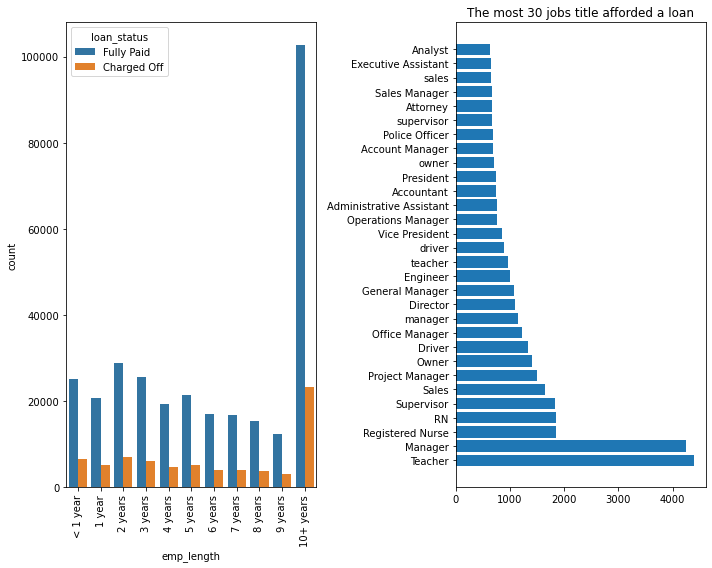

In [12]:
plt.figure(figsize=(10, 8))

plt.subplot(1, 2, 1)

order = ['< 1 year', '1 year', '2 years', '3 years', '4 years', '5 years', 
          '6 years', '7 years', '8 years', '9 years', '10+ years',]

g = sns.countplot(x='emp_length', data=lending_loan_df, hue='loan_status', order=order)
g.set_xticklabels(g.get_xticklabels(), rotation=90);

plt.subplot(1, 2, 2)
plt.barh(lending_loan_df.emp_title.value_counts()[:30].index, 
         lending_loan_df.emp_title.value_counts()[:30])

plt.title("The most 30 jobs title afforded a loan")

plt.tight_layout()

In [ ]:
'''
Issue_d, Earliest_cr_line

issue_d: The month which the loan was funded

earliest_cr_line: The month the borrower's earliest reported credit line was opened (PK a typo? not The Month but The year???)

'''

In [13]:
lending_loan_df['earliest_cr_line'].value_counts()

Oct-2000    3017
Aug-2000    2935
Oct-2001    2896
Aug-2001    2884
Nov-2000    2736
            ... 
Jul-1958       1
Nov-1957       1
Jan-1953       1
Jul-1955       1
Aug-1959       1
Name: earliest_cr_line, Length: 684, dtype: int64

In [14]:
lending_loan_df['issue_d'] = pd.to_datetime(lending_loan_df['issue_d'])
lending_loan_df['earliest_cr_line'] = pd.to_datetime(lending_loan_df['earliest_cr_line'])

In [15]:
lending_loan_df['issue_d'].head()

0   2015-01-01
1   2015-01-01
2   2015-01-01
3   2014-11-01
4   2013-04-01
Name: issue_d, dtype: datetime64[ns]

In [16]:
lending_loan_df['earliest_cr_line'].head()

0   1990-06-01
1   2004-07-01
2   2007-08-01
3   2006-09-01
4   1999-03-01
Name: earliest_cr_line, dtype: datetime64[ns]

In [17]:
lending_loan_df.issue_d.unique()

array(['2015-01-01T00:00:00.000000000', '2014-11-01T00:00:00.000000000',
       '2013-04-01T00:00:00.000000000', '2015-09-01T00:00:00.000000000',
       '2012-09-01T00:00:00.000000000', '2014-10-01T00:00:00.000000000',
       '2012-04-01T00:00:00.000000000', '2013-06-01T00:00:00.000000000',
       '2014-05-01T00:00:00.000000000', '2015-12-01T00:00:00.000000000',
       '2015-04-01T00:00:00.000000000', '2012-10-01T00:00:00.000000000',
       '2014-07-01T00:00:00.000000000', '2013-02-01T00:00:00.000000000',
       '2015-10-01T00:00:00.000000000', '2014-01-01T00:00:00.000000000',
       '2016-03-01T00:00:00.000000000', '2014-04-01T00:00:00.000000000',
       '2011-06-01T00:00:00.000000000', '2010-04-01T00:00:00.000000000',
       '2014-06-01T00:00:00.000000000', '2013-10-01T00:00:00.000000000',
       '2013-05-01T00:00:00.000000000', '2015-02-01T00:00:00.000000000',
       '2011-10-01T00:00:00.000000000', '2015-06-01T00:00:00.000000000',
       '2013-08-01T00:00:00.000000000', '2014-02-01

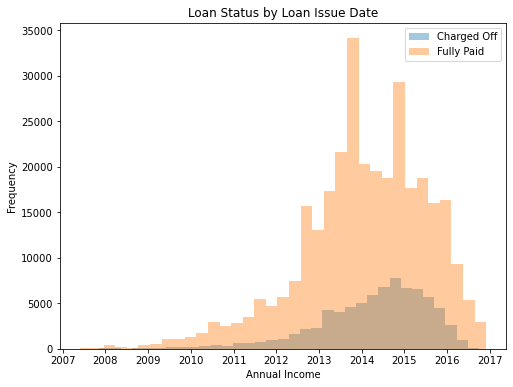

In [18]:
# Loan Status by Loan Issue Date
plt.figure(figsize=(8, 6))
           
plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'issue_d'], label = 'Charged Off', 
         alpha=0.4, bins=35)

plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'issue_d'], label = 'Fully Paid', 
         alpha=0.4, bins=35)

plt.legend()

# Label axes
_ = plt.xlabel('Annual Income')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status by Loan Issue Date')

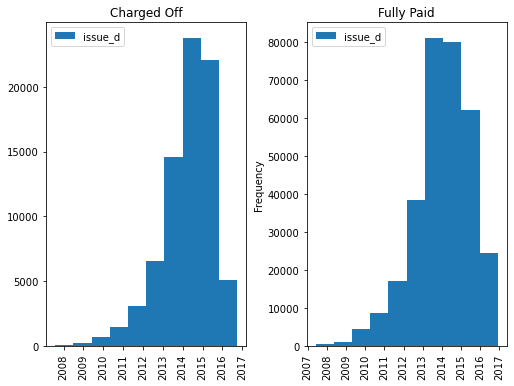

In [23]:
# Loan Status by Loan Issue Date

# Label axes
lending_loan_df.hist(column='issue_d', by='loan_status', legend=True, figsize=(8,6))
#lending_loan_df.hist(column='installment', by='loan_status', sharex=True, sharey=True)  # Not good

plt.ylabel('Frequency')

plt.show()

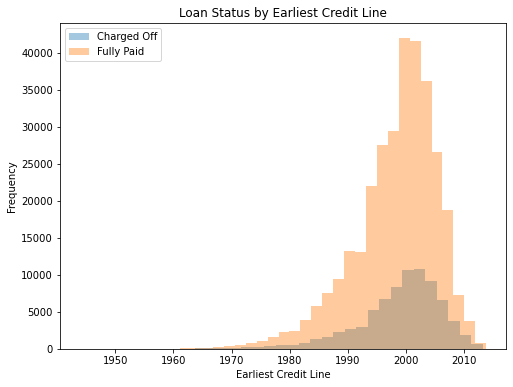

In [19]:
# Loan Status by Earliest Credit Line
plt.figure(figsize=(8, 6))
           
plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'earliest_cr_line'], label = 'Charged Off', 
         alpha=0.4, bins=35)

plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'earliest_cr_line'], label = 'Fully Paid', 
         alpha=0.4, bins=35)

plt.legend()

# Label axes
_ = plt.xlabel('Earliest Credit Line')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status by Earliest Credit Line')

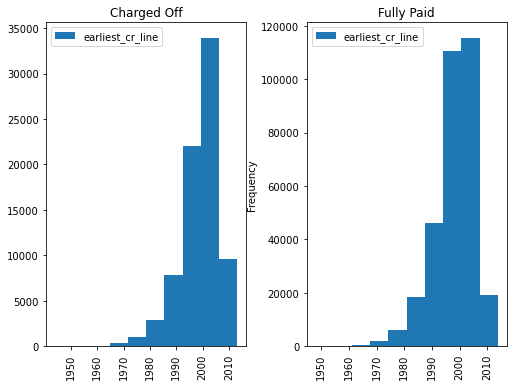

In [24]:
# Loan Status by Earliest Credit Line

# Label axes
lending_loan_df.hist(column='earliest_cr_line', by='loan_status', legend=True, figsize=(8,6))
#lending_loan_df.hist(column='installment', by='loan_status', sharex=True, sharey=True)  # Not good

plt.ylabel('Frequency')

plt.show()

In [ ]:
'''
Title

title: The loan title provided by the borrower

'''

In [ ]:
# title will be removed because we have the purpose column which is generated from it.

In [26]:
lending_loan_df.title.isna().sum()

1755

In [27]:
lending_loan_df.title.head(10)

0                   Vacation
1         Debt consolidation
2    Credit card refinancing
3    Credit card refinancing
4      Credit Card Refinance
5         Debt consolidation
6           Home improvement
7       No More Credit Cards
8         Debt consolidation
9         Debt Consolidation
Name: title, dtype: object

In [20]:
lending_loan_df['title'] = lending_loan_df.title.str.lower()

In [21]:
lending_loan_df.title.value_counts()[:10]

debt consolidation           168108
credit card refinancing       51781
home improvement              17117
other                         12993
consolidation                  5583
major purchase                 4998
debt consolidation loan        3513
business                       3017
medical expenses               2820
credit card consolidation      2638
Name: title, dtype: int64

In [30]:
lending_loan_df.purpose.head(10)

0              vacation
1    debt_consolidation
2           credit_card
3           credit_card
4           credit_card
5    debt_consolidation
6      home_improvement
7           credit_card
8    debt_consolidation
9    debt_consolidation
Name: purpose, dtype: object

In [31]:
lending_loan_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 28 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   loan_amnt             396030 non-null  float64       
 1   term                  396030 non-null  object        
 2   int_rate              396030 non-null  float64       
 3   installment           396030 non-null  float64       
 4   grade                 396030 non-null  object        
 5   sub_grade             396030 non-null  object        
 6   emp_title             373103 non-null  object        
 7   emp_length            377729 non-null  object        
 8   home_ownership        396030 non-null  object        
 9   annual_inc            396030 non-null  float64       
 10  verification_status   396030 non-null  object        
 11  issue_d               396030 non-null  datetime64[ns]
 12  loan_status           396030 non-null  object        
 13 

In [ ]:
'''
dti, open_acc, revol_bal, revol_util, & total_acc

dti: A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, 
excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.

open_acc: The number of open credit lines in the borrower's credit file.

revol_bal: Total credit revolving balance

revol_util: Revolving line utilization rate, or the amount of credit the borrower is using 
relative to all available revolving credit.

total_acc: The total number of credit lines currently in the borrower's credit file

PK: open_acc >= total_acc   (Jin agreed)
'''

In [22]:
lending_loan_df.dti.value_counts()

0.00     313
14.40    310
19.20    302
16.80    301
18.00    300
        ... 
59.18      1
48.37      1
45.71      1
42.38      1
55.53      1
Name: dti, Length: 4262, dtype: int64

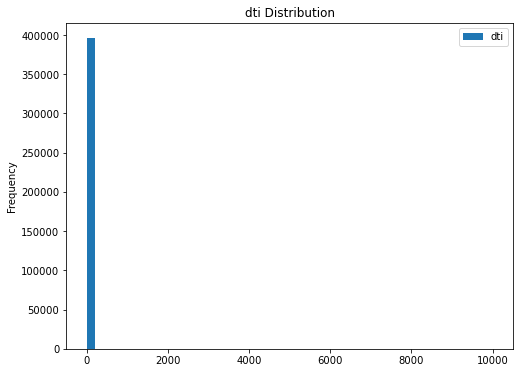

In [38]:
# dti Histogram
lending_loan_df.dti.plot(kind='hist', bins=50, legend=True, figsize=(8,6), xlabel='dti', 
                     ylabel='Frequency', title='dti Distribution')

plt.show()

<AxesSubplot:title={'center':'dti (<= 50) Distribution'}, ylabel='Frequency'>

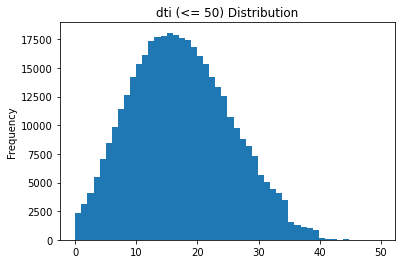

In [13]:
# Sub_dti Histogram
lending_loan_df[lending_loan_df['dti']<= 50].dti.plot(kind='hist', bins=50, 
    title="dti (<= 50) Distribution", xlabel='dti', ylabel='Frequency')

In [22]:
# RangeIndex: 396030 entries, 0 to 396029
# 395734 + 296 = 396030

print(lending_loan_df[lending_loan_df['dti'] <= 40].shape)
print(lending_loan_df[lending_loan_df['dti'] > 40].shape)

(395734, 27)
(296, 27)


In [26]:
lending_loan_df.loc[lending_loan_df['dti'] <= 40, 'loan_status'].value_counts()

Fully Paid     318157
Charged Off     77577
Name: loan_status, dtype: int64

In [27]:
lending_loan_df.loc[lending_loan_df['dti'] > 40, 'loan_status'].value_counts()

Fully Paid     200
Charged Off     96
Name: loan_status, dtype: int64

In [14]:
lending_loan_df.loc[lending_loan_df['dti']> 50, 'loan_status'].value_counts()

Fully Paid     26
Charged Off     9
Name: loan_status, dtype: int64

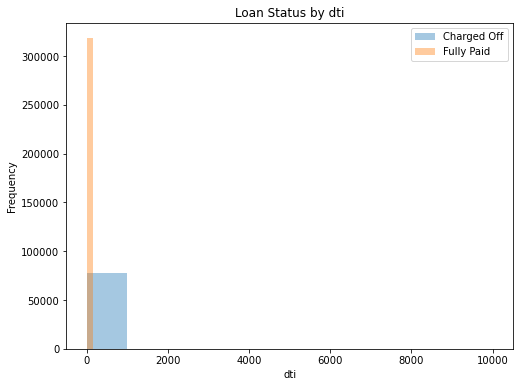

In [19]:
# Loan Status by dti
plt.figure(figsize=(8, 6))
           
plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'dti'], label = 'Charged Off', 
         alpha=0.4)

plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'dti'], label = 'Fully Paid', 
         alpha=0.4)

plt.legend()

# Label axes
_ = plt.xlabel('dti')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status by dti')

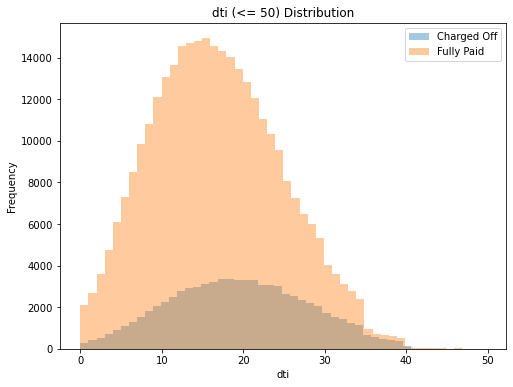

In [15]:
# dti (<= 50) Distribution
plt.figure(figsize=(8, 6))
           
plt.hist(lending_loan_df.loc[(lending_loan_df['loan_status']=='Charged Off') & (lending_loan_df['dti']<= 50), 
                             'dti'], label = 'Charged Off', alpha=0.4, bins=50)

plt.hist(lending_loan_df.loc[(lending_loan_df['loan_status']=='Fully Paid') & (lending_loan_df['dti']<= 50),
                             'dti'], label = 'Fully Paid', alpha=0.4, bins=50)

plt.legend()

# Label axes
_ = plt.xlabel('dti')
_ = plt.ylabel('Frequency')
_ = plt.title('dti (<= 50) Distribution')

In [18]:
lending_loan_df.dti.describe()

count    396030.000000
mean         17.379514
std          18.019092
min           0.000000
25%          11.280000
50%          16.910000
75%          22.980000
max        9999.000000
Name: dti, dtype: float64

In [ ]:
'''
It seems that the smaller the dti the more likely that the loan will not be paid.

'''

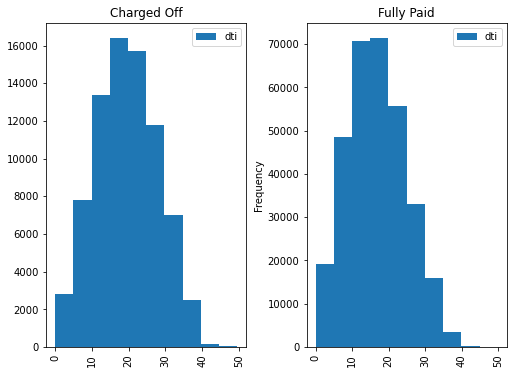

In [16]:
# dti (<= 50) Distribution

# Label axes
lending_loan_df[lending_loan_df['dti']<= 50].hist(column='dti', by='loan_status', legend=True, figsize=(8,6))

plt.ylabel('Frequency')

plt.show()

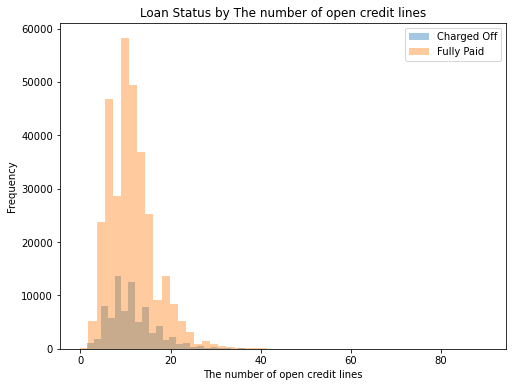

In [29]:
# Loan Status by The number of open credit lines
plt.figure(figsize=(8, 6))
           
plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'open_acc'], 
                             label = 'Charged Off', alpha=0.4, bins=50)

plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'open_acc'],
                             label = 'Fully Paid', alpha=0.4, bins=50)

plt.legend()

# Label axes
_ = plt.xlabel('The number of open credit lines')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status by The number of open credit lines')

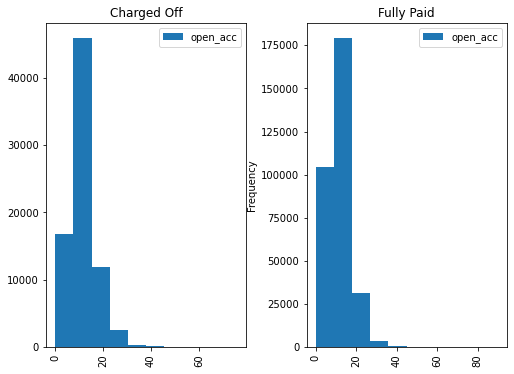

In [56]:
# Loan Status by The number of open credit lines
lending_loan_df.hist(column='open_acc', by='loan_status', legend=True, figsize=(8,6))

#plt.xlabel('The number of open credit lines')
plt.ylabel('Frequency')

plt.show()

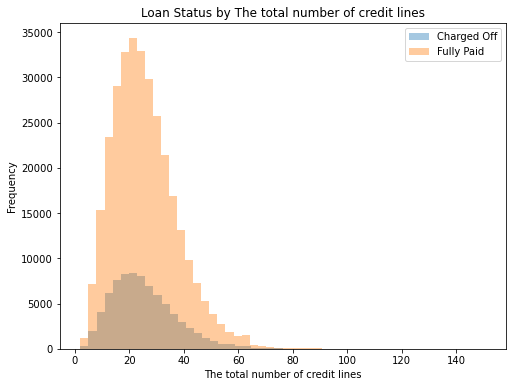

In [30]:
# Loan Status by The total number of credit lines
plt.figure(figsize=(8, 6))
           
plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'total_acc'], 
                             label = 'Charged Off', alpha=0.4, bins=50)

plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'total_acc'],
                             label = 'Fully Paid', alpha=0.4, bins=50)

plt.legend()

# Label axes
_ = plt.xlabel('The total number of credit lines')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status by The total number of credit lines')

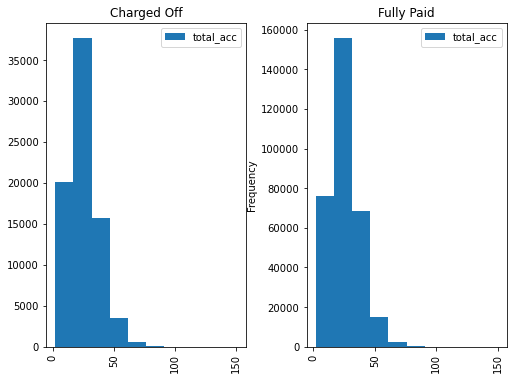

In [57]:
# Loan Status by The total number of credit lines
lending_loan_df.hist(column='total_acc', by='loan_status', legend=True, figsize=(8,6))

#plt.xlabel('The number of open credit lines')
plt.ylabel('Frequency')

plt.show()

In [31]:
print(lending_loan_df.shape)

print(lending_loan_df[lending_loan_df.open_acc > 40].shape)

(396030, 27)
(217, 27)


In [32]:
print(lending_loan_df.shape)

print(lending_loan_df[lending_loan_df.total_acc > 80].shape)

(396030, 27)
(266, 27)


In [ ]:
'''
By definitions, Open credit lines >= total number of credit lines.

Also, two corresponding histograms show that too comparing their frequencies or counts.
'''

In [33]:
print(lending_loan_df.shape)

print(lending_loan_df[lending_loan_df.revol_util > 120].shape)

(396030, 27)
(27, 27)


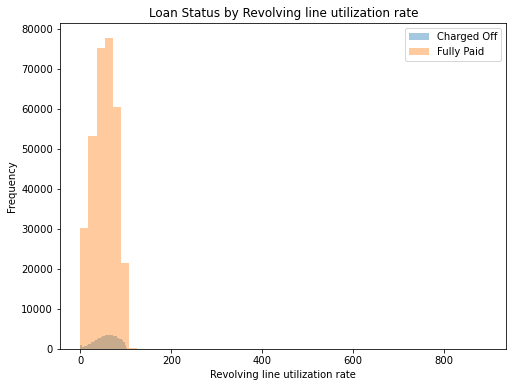

In [34]:
# Loan Status by Revolving line utilization rate
plt.figure(figsize=(8, 6))
           
plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'revol_util'], 
                             label = 'Charged Off', alpha=0.4, bins=50)

plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'revol_util'],
                             label = 'Fully Paid', alpha=0.4, bins=50)

plt.legend()

# Label axes
_ = plt.xlabel('Revolving line utilization rate')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status by Revolving line utilization rate')

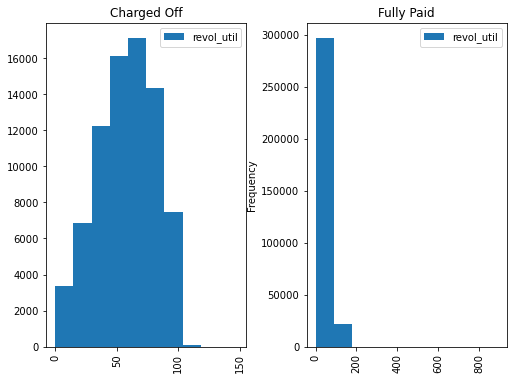

In [61]:
# Loan Status by Revolving line utilization rate???
lending_loan_df.hist(column='revol_util', by='loan_status', legend=True, figsize=(8,6))

plt.ylabel('Frequency')

plt.show()

In [ ]:
'''
Charged Off histogram on the left shows around 120, which is the base for choosing Revolving line utilization rate < 120.

'''

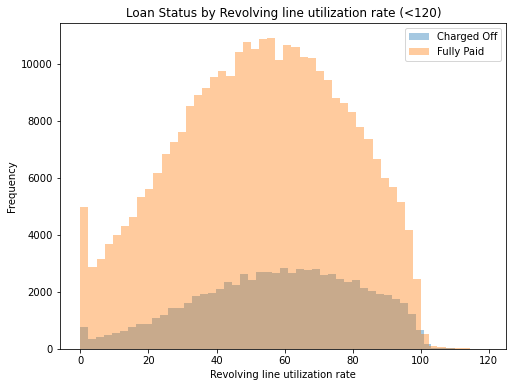

In [36]:
# Loan Status by Revolving line utilization rate (<120)
plt.figure(figsize=(8, 6))
           
plt.hist(lending_loan_df.loc[(lending_loan_df['loan_status']=='Charged Off') & (lending_loan_df['revol_util'] < 120), 
                             'revol_util'], label = 'Charged Off', alpha=0.4, bins=50)

plt.hist(lending_loan_df.loc[(lending_loan_df['loan_status']=='Fully Paid') & (lending_loan_df['revol_util'] < 120),
                             'revol_util'], label = 'Fully Paid', alpha=0.4, bins=50)

plt.legend()

# Label axes
_ = plt.xlabel('Revolving line utilization rate')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status by Revolving line utilization rate (<120)')

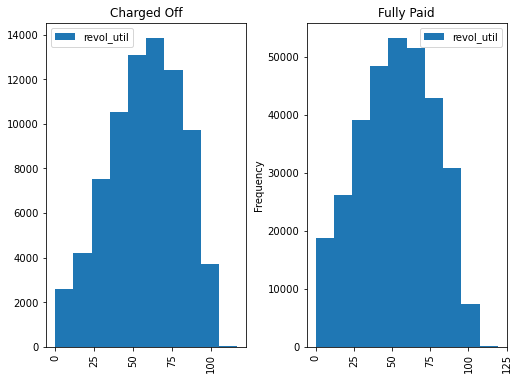

In [62]:
# Loan Status by Revolving line utilization rate (<120)
lending_loan_df[lending_loan_df.revol_util < 120].hist(column='revol_util', by='loan_status', legend=True, figsize=(8,6))

plt.ylabel('Frequency')

plt.show()

In [37]:
lending_loan_df[lending_loan_df.revol_util > 200]

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
137211,3500.0,36 months,12.49,117.08,B,B4,Budget Analyst,10+ years,RENT,45000.0,...,2.0,0.0,2677.0,892.3,9.0,f,INDIVIDUAL,0.0,0.0,"12506 Connie Burg\r\nVelasquezfort, TN 00813"


In [38]:
print(lending_loan_df.shape)
print(lending_loan_df[lending_loan_df.revol_bal > 250000].shape)

(396030, 27)
(397, 27)


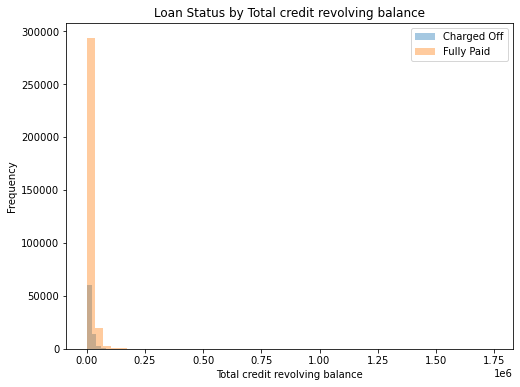

In [3]:
# Loan Status by Total credit revolving balance
plt.figure(figsize=(8, 6))
           
plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'revol_bal'], 
                             label = 'Charged Off', alpha=0.4, bins=50)

plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'revol_bal'],
                             label = 'Fully Paid', alpha=0.4, bins=50)

plt.legend()

# Label axes
_ = plt.xlabel('Total credit revolving balance')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status by Total credit revolving balance')

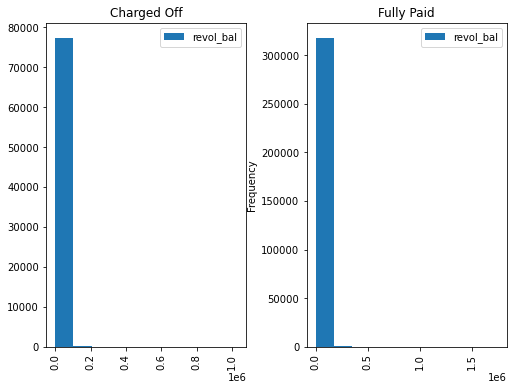

In [66]:
# Loan Status by Total credit revolving balance
lending_loan_df.hist(column='revol_bal', by='loan_status', legend=True, figsize=(8,6))

plt.ylabel('Frequency')

plt.show()

In [ ]:
'''
Choice for Revolving balance cut < 250000 is modelled using Fully Paid histogram on the right.

'''

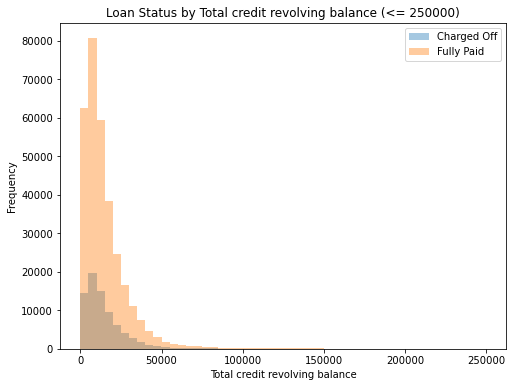

In [7]:
# Loan Status by Total credit revolving balance (<250000)
plt.figure(figsize=(8, 6))
           
plt.hist(lending_loan_df.loc[(lending_loan_df['loan_status']=='Charged Off') & (lending_loan_df['revol_bal'] <= 250000), 
                             'revol_bal'], label = 'Charged Off', alpha=0.4, bins=50)

plt.hist(lending_loan_df.loc[(lending_loan_df['loan_status']=='Fully Paid') & (lending_loan_df['revol_bal'] <= 250000),
                             'revol_bal'], label = 'Fully Paid', alpha=0.4, bins=50)

plt.legend()

# Label axes
_ = plt.xlabel('Total credit revolving balance')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status by Total credit revolving balance (<= 250000)')

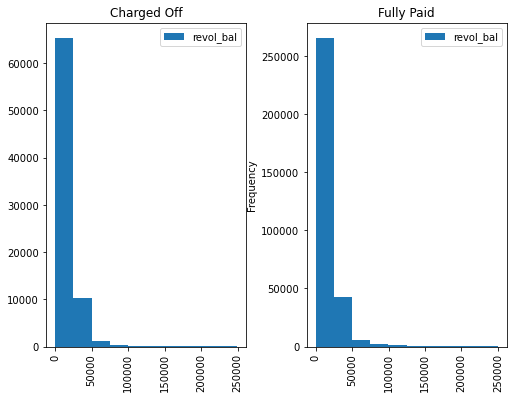

In [70]:
# Loan Status by Total credit revolving balance (<250000)
lending_loan_df[lending_loan_df.revol_bal <=250000].hist(column='revol_bal', by='loan_status', legend=True, figsize=(8,6))

plt.ylabel('Frequency')

plt.show()

In [8]:
lending_loan_df.loc[lending_loan_df.revol_bal > 250000, 'loan_status'].value_counts()

Fully Paid     351
Charged Off     46
Name: loan_status, dtype: int64

In [ ]:
'''
pub_rec, initial_list_status, application_type, mort_acc, & pub_rec_bankruptcies

pub_rec: Number of derogatory public records

initial_list_status: The initial listing status of the loan. 
Possible values are – W, F

application_type: Indicates whether the loan is an individual application or a joint application with two co-borrowers

mort_acc: Number of mortgage accounts

pub_rec_bankruptcies: Number of public record bankruptcies

'''

In [60]:
lending_loan_df.pub_rec.unique()

array([ 0.,  1.,  2.,  3.,  4.,  6.,  5.,  8.,  9., 10., 11.,  7., 19.,
       13., 40., 17., 86., 12., 24., 15.])

In [53]:
# Keep
charged_off = lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'pub_rec'].value_counts(sort=True)

charged_off

0.0     65339
1.0     10469
2.0      1254
3.0       340
4.0       145
5.0        56
6.0        31
7.0        16
8.0         6
9.0         5
12.0        4
19.0        2
10.0        2
40.0        1
13.0        1
86.0        1
11.0        1
Name: pub_rec, dtype: int64

In [33]:
len(charged_off)

17

In [49]:
# Keep
fully_paid = lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'pub_rec'].value_counts(sort=True)

fully_paid

0.0     272933
1.0      39270
2.0       4222
3.0       1181
4.0        382
5.0        181
6.0         91
7.0         40
8.0         28
10.0         9
9.0          7
11.0         7
13.0         3
17.0         1
24.0         1
15.0         1
Name: pub_rec, dtype: int64

In [35]:
len(fully_paid)

16

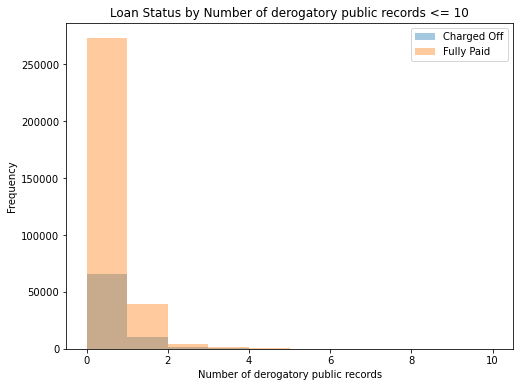

In [59]:
# Loan Status by Number of derogatory public records
plt.figure(figsize=(8, 6))
           
plt.hist(lending_loan_df.loc[(lending_loan_df['loan_status']=='Charged Off') & (lending_loan_df['pub_rec'] <= 10), 
                             'pub_rec'], label = 'Charged Off', alpha=0.4)

plt.hist(lending_loan_df.loc[(lending_loan_df['loan_status']=='Fully Paid') & (lending_loan_df['pub_rec'] <= 10),
                             'pub_rec'], label = 'Fully Paid', alpha=0.4)

plt.legend()

# Label axes
_ = plt.xlabel('Number of derogatory public records')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status by Number of derogatory public records <= 10')

# PK: Frequency values are very high compared to x-values so no difference in number of bins chosen

In [45]:
lending_loan_df.pub_rec.unique()

array([ 0.,  1.,  2.,  3.,  4.,  6.,  5.,  8.,  9., 10., 11.,  7., 19.,
       13., 40., 17., 86., 12., 24., 15.])

In [64]:
lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'initial_list_status'].value_counts()

f    192105
w    126252
Name: initial_list_status, dtype: int64

In [66]:
192105/(192105 + 126252)*100

60.34263421253498

In [65]:
lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'initial_list_status'].value_counts(sort=True)

f    45961
w    31712
Name: initial_list_status, dtype: int64

In [67]:
45961/(45961 + 31712)*100

59.172427999433516

In [69]:
(45961 + 31712)/396030*100

19.61290811302174

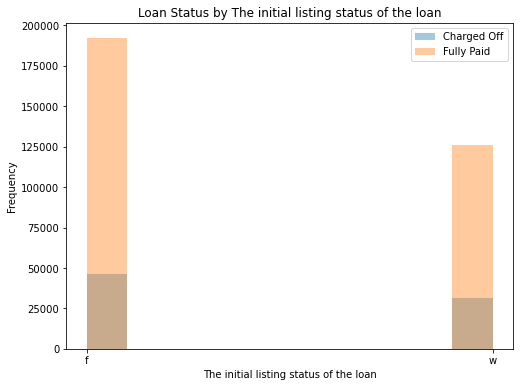

In [61]:
# Loan Status by The initial listing status of the loan
# w = whole loan; f = fractional loan

plt.figure(figsize=(8, 6))
           
plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'initial_list_status'], 
                             label = 'Charged Off', alpha=0.4)

plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'initial_list_status'],
                             label = 'Fully Paid', alpha=0.4)

plt.legend()

# Label axes
_ = plt.xlabel('The initial listing status of the loan')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status by The initial listing status of the loan')

In [71]:
lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'application_type'].value_counts()

INDIVIDUAL    317802
JOINT            371
DIRECT_PAY       184
Name: application_type, dtype: int64

In [73]:
lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'application_type'].value_counts()

INDIVIDUAL    77517
DIRECT_PAY      102
JOINT            54
Name: application_type, dtype: int64

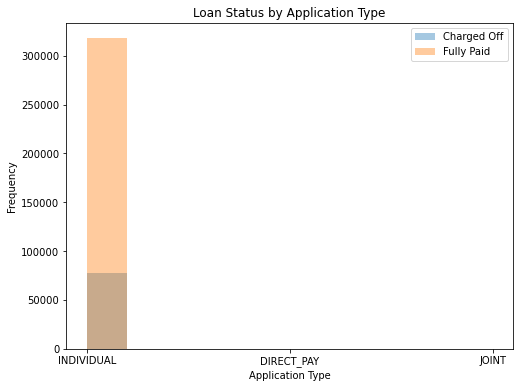

In [74]:
# Loan Status by Application Type
# w = whole loan; f = fractional loan

plt.figure(figsize=(8, 6))
           
plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'application_type'], 
                             label = 'Charged Off', alpha=0.4)

plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'application_type'],
                             label = 'Fully Paid', alpha=0.4)

plt.legend()

# Label axes
_ = plt.xlabel('Application Type')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status by Application Type')

In [75]:
lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'pub_rec_bankruptcies'].value_counts()

0.0    282059
1.0     34063
2.0      1418
3.0       277
4.0        56
5.0        27
6.0         5
7.0         3
8.0         1
Name: pub_rec_bankruptcies, dtype: int64

In [76]:
lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'pub_rec_bankruptcies'].value_counts()

0.0    68321
1.0     8727
2.0      429
3.0       74
4.0       26
5.0        5
6.0        2
8.0        1
7.0        1
Name: pub_rec_bankruptcies, dtype: int64

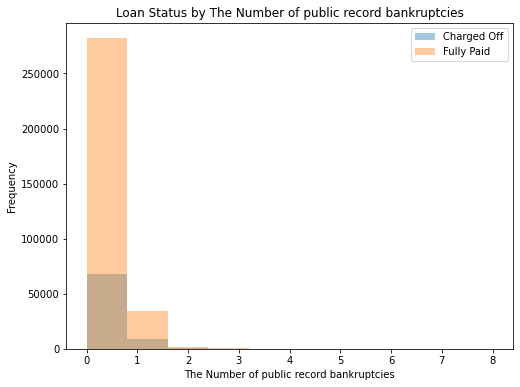

In [77]:
# Loan Status by The Number of public record bankruptcies
plt.figure(figsize=(8, 6))
           
plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Charged Off', 'pub_rec_bankruptcies'], 
                             label = 'Charged Off', alpha=0.4)

plt.hist(lending_loan_df.loc[lending_loan_df['loan_status']=='Fully Paid', 'pub_rec_bankruptcies'],
                             label = 'Fully Paid', alpha=0.4)

plt.legend()

# Label axes
_ = plt.xlabel('The Number of public record bankruptcies')
_ = plt.ylabel('Frequency')
_ = plt.title('Loan Status by The Number of public record bankruptcies')

In [80]:
def pub_rec(number):
    if number == 0.0:
        return 0
    else:
        return 1
    
def mort_acc(number):
    if number == 0.0:
        return 0
    elif number >= 1.0:
        return 1
    else:
        return number
    
def pub_rec_bankruptcies(number):
    if number == 0.0:
        return 0
    elif number >= 1.0:
        return 1
    else:
        return number

In [81]:
lending_loan_df['pub_rec'] = lending_loan_df.pub_rec.apply(pub_rec)
lending_loan_df['mort_acc'] = lending_loan_df.mort_acc.apply(mort_acc)
lending_loan_df['pub_rec_bankruptcies'] = lending_loan_df.pub_rec_bankruptcies.apply(pub_rec_bankruptcies)

<AxesSubplot:xlabel='pub_rec_bankruptcies', ylabel='count'>

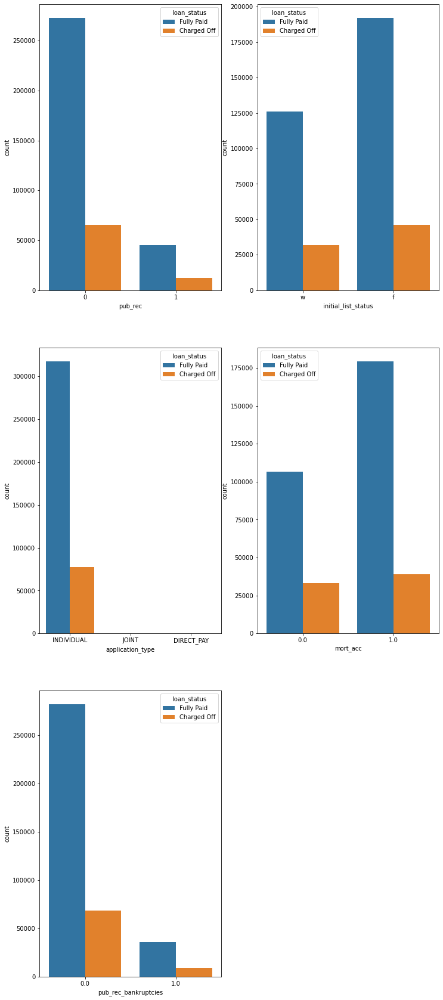

In [82]:
plt.figure(figsize=(12, 30))

plt.subplot(3, 2, 1)
sns.countplot(x='pub_rec', data=lending_loan_df, hue='loan_status')

plt.subplot(3, 2, 2)
sns.countplot(x='initial_list_status', data=lending_loan_df, hue='loan_status')

plt.subplot(3, 2, 3)
sns.countplot(x='application_type', data=lending_loan_df, hue='loan_status')

plt.subplot(3, 2, 4)
sns.countplot(x='mort_acc', data=lending_loan_df, hue='loan_status')

plt.subplot(3, 2, 5)
sns.countplot(x='pub_rec_bankruptcies', data=lending_loan_df, hue='loan_status')

In [ ]:
'''
How numeric features correlate with the target variable?

'''

In [29]:
lending_loan_df['loan_status'] = lending_loan_df.loan_status.map({'Fully Paid':1, 'Charged Off':0})

<AxesSubplot:title={'center':'Bar Plot of Loan Status Counts'}, xlabel='Count', ylabel='Loan Status'>

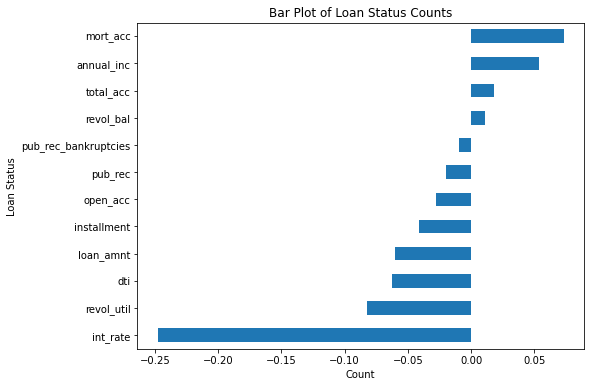

In [4]:
# PK: This barh chart is very important!!

# Bar plot

plt.figure(figsize=(8, 6))

# Add x Label on x-axis
plt.xlabel("Correlation")

# Add y Label on y-axis
plt.ylabel("Numerical Features")

# Add a title to graph
plt.title("Correlation between Loan status and Numeric Features")

#lending_loan_df['loan_status'].value_counts().plot(kind='barh')

lending_loan_df.corr()['loan_status'].drop('loan_status').sort_values().plot(kind='barh')

In [ ]:
'''
Interpretation of barh

Since 'Fully Paid':1, 'Charged Off':0 so features having positive relationship in barh have negative
relationship with 'Charged Off' and features having negative relationship in barh have positive
relationship with 'Charged Off', I think.

'''

In [ ]:
'''
Data PreProcessing
Section Goals:

Remove or fill any missing data.

Remove unnecessary or repetitive features.

Convert categorical string features to dummy variables.

'''

In [30]:
# The length of the data
print(f"The Length of the data: {lending_loan_df.shape}")

The Length of the data: (396030, 27)


In [31]:
# Missing values
for column in lending_loan_df.columns:
    if lending_loan_df[column].isna().sum() != 0:
        missing = lending_loan_df[column].isna().sum()
        portion = (missing / lending_loan_df.shape[0]) * 100
        print(f"'{column}': number of missing values '{missing}' ==> '{portion:.3f}%'")


'emp_title': number of missing values '22927' ==> '5.789%'
'emp_length': number of missing values '18301' ==> '4.621%'
'title': number of missing values '1755' ==> '0.443%'
'revol_util': number of missing values '276' ==> '0.070%'
'mort_acc': number of missing values '37795' ==> '9.543%'
'pub_rec_bankruptcies': number of missing values '535' ==> '0.135%'


In [32]:
lending_loan_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   loan_amnt             396030 non-null  float64
 1   term                  396030 non-null  object 
 2   int_rate              396030 non-null  float64
 3   installment           396030 non-null  float64
 4   grade                 396030 non-null  object 
 5   sub_grade             396030 non-null  object 
 6   emp_title             373103 non-null  object 
 7   emp_length            377729 non-null  object 
 8   home_ownership        396030 non-null  object 
 9   annual_inc            396030 non-null  float64
 10  verification_status   396030 non-null  object 
 11  issue_d               396030 non-null  object 
 12  loan_status           396030 non-null  int64  
 13  purpose               396030 non-null  object 
 14  title                 394275 non-null  object 
 15  

In [33]:
lending_loan_df.isnull().sum()

loan_amnt                   0
term                        0
int_rate                    0
installment                 0
grade                       0
sub_grade                   0
emp_title               22927
emp_length              18301
home_ownership              0
annual_inc                  0
verification_status         0
issue_d                     0
loan_status                 0
purpose                     0
title                    1755
dti                         0
earliest_cr_line            0
open_acc                    0
pub_rec                     0
revol_bal                   0
revol_util                276
total_acc                   0
initial_list_status         0
application_type            0
mort_acc                37795
pub_rec_bankruptcies      535
address                     0
dtype: int64

In [7]:
lending_loan_df.emp_title.nunique()

173105

In [34]:
lending_loan_df.drop('emp_title', axis=1, inplace=True)

In [35]:
lending_loan_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 26 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   loan_amnt             396030 non-null  float64
 1   term                  396030 non-null  object 
 2   int_rate              396030 non-null  float64
 3   installment           396030 non-null  float64
 4   grade                 396030 non-null  object 
 5   sub_grade             396030 non-null  object 
 6   emp_length            377729 non-null  object 
 7   home_ownership        396030 non-null  object 
 8   annual_inc            396030 non-null  float64
 9   verification_status   396030 non-null  object 
 10  issue_d               396030 non-null  object 
 11  loan_status           396030 non-null  int64  
 12  purpose               396030 non-null  object 
 13  title                 394275 non-null  object 
 14  dti                   396030 non-null  float64
 15  

In [10]:
lending_loan_df.emp_length.unique()

array(['10+ years', '4 years', '< 1 year', '6 years', '9 years',
       '2 years', '3 years', '8 years', '7 years', '5 years', '1 year',
       nan], dtype=object)

In [19]:
for year in lending_loan_df.emp_length.unique():
    print(f"{year} years in this position:")
    print(f"{lending_loan_df[lending_loan_df.emp_length == year].loan_status.value_counts(normalize=True)}")
    print('==========================================')

10+ years years in this position:
1    0.815814
0    0.184186
Name: loan_status, dtype: float64
4 years years in this position:
1    0.807615
0    0.192385
Name: loan_status, dtype: float64
< 1 year years in this position:
1    0.793128
0    0.206872
Name: loan_status, dtype: float64
6 years years in this position:
1    0.810806
0    0.189194
Name: loan_status, dtype: float64
9 years years in this position:
1    0.79953
0    0.20047
Name: loan_status, dtype: float64
2 years years in this position:
1    0.806738
0    0.193262
Name: loan_status, dtype: float64
3 years years in this position:
1    0.804769
0    0.195231
Name: loan_status, dtype: float64
8 years years in this position:
1    0.80024
0    0.19976
Name: loan_status, dtype: float64
7 years years in this position:
1    0.805226
0    0.194774
Name: loan_status, dtype: float64
5 years years in this position:
1    0.807813
0    0.192187
Name: loan_status, dtype: float64
1 year years in this position:
1    0.800865
0    0.199135
Na

In [36]:
lending_loan_df.drop('emp_length', axis=1, inplace=True)

In [37]:
lending_loan_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 25 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   loan_amnt             396030 non-null  float64
 1   term                  396030 non-null  object 
 2   int_rate              396030 non-null  float64
 3   installment           396030 non-null  float64
 4   grade                 396030 non-null  object 
 5   sub_grade             396030 non-null  object 
 6   home_ownership        396030 non-null  object 
 7   annual_inc            396030 non-null  float64
 8   verification_status   396030 non-null  object 
 9   issue_d               396030 non-null  object 
 10  loan_status           396030 non-null  int64  
 11  purpose               396030 non-null  object 
 12  title                 394275 non-null  object 
 13  dti                   396030 non-null  float64
 14  earliest_cr_line      396030 non-null  object 
 15  

In [22]:
# title will be removed because we have the purpose column which is generated from it.

lending_loan_df.title.value_counts().head()

Debt consolidation         152472
Credit card refinancing     51487
Home improvement            15264
Other                       12930
Debt Consolidation          11608
Name: title, dtype: int64

In [23]:
lending_loan_df.purpose.value_counts().head()

debt_consolidation    234507
credit_card            83019
home_improvement       24030
other                  21185
major_purchase          8790
Name: purpose, dtype: int64

In [38]:
lending_loan_df.drop('title', axis=1, inplace=True)

In [39]:
lending_loan_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 24 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   loan_amnt             396030 non-null  float64
 1   term                  396030 non-null  object 
 2   int_rate              396030 non-null  float64
 3   installment           396030 non-null  float64
 4   grade                 396030 non-null  object 
 5   sub_grade             396030 non-null  object 
 6   home_ownership        396030 non-null  object 
 7   annual_inc            396030 non-null  float64
 8   verification_status   396030 non-null  object 
 9   issue_d               396030 non-null  object 
 10  loan_status           396030 non-null  int64  
 11  purpose               396030 non-null  object 
 12  dti                   396030 non-null  float64
 13  earliest_cr_line      396030 non-null  object 
 14  open_acc              396030 non-null  float64
 15  

In [27]:
lending_loan_df.mort_acc.value_counts()

0.0     139777
1.0      60416
2.0      49948
3.0      38049
4.0      27887
5.0      18194
6.0      11069
7.0       6052
8.0       3121
9.0       1656
10.0       865
11.0       479
12.0       264
13.0       146
14.0       107
15.0        61
16.0        37
17.0        22
18.0        18
19.0        15
20.0        13
24.0        10
22.0         7
21.0         4
25.0         4
27.0         3
32.0         2
31.0         2
23.0         2
26.0         2
28.0         1
30.0         1
34.0         1
Name: mort_acc, dtype: int64

In [40]:
lending_loan_df.mort_acc.value_counts().sum()

358235

In [41]:
358235 - 139777

218458

In [42]:
lending_loan_df.mort_acc.isna().sum()

37795

<AxesSubplot:title={'center':'Correlation between Mortgage Account and Numeric Features'}, xlabel='Correlation', ylabel='Numerical Features'>

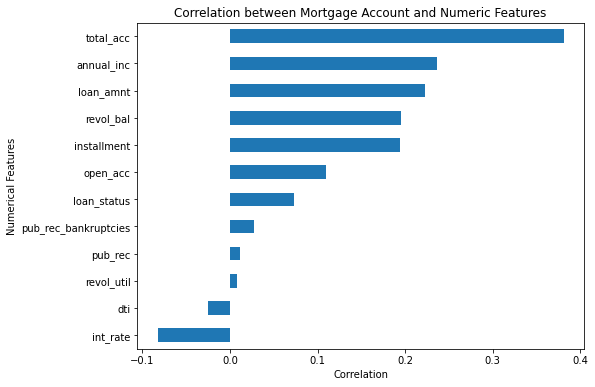

In [31]:
#data.corr()['mort_acc'].drop('mort_acc').sort_values().hvplot.barh()

# Bar plot

plt.figure(figsize=(8, 6))

# Add x Label on x-axis
plt.xlabel("Correlation")

# Add y Label on y-axis
plt.ylabel("Numerical Features")

# Add a title to graph
plt.title("Correlation between Mortgage Account and Numeric Features")

#lending_loan_df['loan_status'].value_counts().plot(kind='barh')

lending_loan_df.corr()['mort_acc'].drop('mort_acc').sort_values().plot(kind='barh')

In [15]:
lending_loan_df.total_acc.head()

0    25.0
1    27.0
2    26.0
3    13.0
4    43.0
Name: total_acc, dtype: float64

In [45]:
total_acc_avg = lending_loan_df.groupby(by='total_acc').mean().mort_acc

total_acc_avg

total_acc
2.0      0.000000
3.0      0.052023
4.0      0.066743
5.0      0.103289
6.0      0.151293
           ...   
124.0    1.000000
129.0    1.000000
135.0    3.000000
150.0    2.000000
151.0    0.000000
Name: mort_acc, Length: 118, dtype: float64

In [46]:
def fill_mort_acc(total_acc, mort_acc):
    if np.isnan(mort_acc):
        return total_acc_avg[total_acc].round()
    else:
        return mort_acc


In [47]:
lending_loan_df['mort_acc'] = lending_loan_df.apply(lambda x: fill_mort_acc(x['total_acc'], x['mort_acc']), axis=1)

lending_loan_df['mort_acc'].head(10)

0    0.0
1    3.0
2    0.0
3    0.0
4    1.0
5    4.0
6    3.0
7    0.0
8    3.0
9    1.0
Name: mort_acc, dtype: float64

In [48]:
lending_loan_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 24 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   loan_amnt             396030 non-null  float64
 1   term                  396030 non-null  object 
 2   int_rate              396030 non-null  float64
 3   installment           396030 non-null  float64
 4   grade                 396030 non-null  object 
 5   sub_grade             396030 non-null  object 
 6   home_ownership        396030 non-null  object 
 7   annual_inc            396030 non-null  float64
 8   verification_status   396030 non-null  object 
 9   issue_d               396030 non-null  object 
 10  loan_status           396030 non-null  int64  
 11  purpose               396030 non-null  object 
 12  dti                   396030 non-null  float64
 13  earliest_cr_line      396030 non-null  object 
 14  open_acc              396030 non-null  float64
 15  

In [ ]:
'''
As you can see there is no missing values with mort_acc now.

'''

In [49]:
for column in lending_loan_df.columns:
    if lending_loan_df[column].isna().sum() != 0:
        missing = lending_loan_df[column].isna().sum()
        portion = (missing / lending_loan_df.shape[0]) * 100
        print(f"'{column}': number of missing values '{missing}' ==> '{portion:.3f}%'")

'revol_util': number of missing values '276' ==> '0.070%'
'pub_rec_bankruptcies': number of missing values '535' ==> '0.135%'


In [53]:
lending_loan_df.dropna(inplace=True)

In [ ]:
'''
These two features have missing data points, but they account for less than 0.5% of the total data. 
So, I remove the rows that are missing those values in those columns with dropna().

'''

In [54]:
lending_loan_df.shape

(395219, 24)

In [55]:
# Confirming
396030 - (276 + 535)

395219

In [ ]:
'''
Categorical Variables and Dummy Variables

'''

In [56]:
print([column for column in lending_loan_df.columns if lending_loan_df[column].dtype == object])

['term', 'grade', 'sub_grade', 'home_ownership', 'verification_status', 'issue_d', 'purpose', 'earliest_cr_line', 'initial_list_status', 'application_type', 'address']


In [57]:
lending_loan_df.term.unique()

array([' 36 months', ' 60 months'], dtype=object)

In [58]:
term_values = {' 36 months': 36, ' 60 months': 60}
lending_loan_df['term'] = lending_loan_df.term.map(term_values)

In [ ]:
'''
Convert categorical values of term feature to numerical values, 36 and 60.

'''

In [59]:
lending_loan_df.term.unique()

array([36, 60], dtype=int64)

In [60]:
lending_loan_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 395219 entries, 0 to 396029
Data columns (total 24 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   loan_amnt             395219 non-null  float64
 1   term                  395219 non-null  int64  
 2   int_rate              395219 non-null  float64
 3   installment           395219 non-null  float64
 4   grade                 395219 non-null  object 
 5   sub_grade             395219 non-null  object 
 6   home_ownership        395219 non-null  object 
 7   annual_inc            395219 non-null  float64
 8   verification_status   395219 non-null  object 
 9   issue_d               395219 non-null  object 
 10  loan_status           395219 non-null  int64  
 11  purpose               395219 non-null  object 
 12  dti                   395219 non-null  float64
 13  earliest_cr_line      395219 non-null  object 
 14  open_acc              395219 non-null  float64
 15  

In [ ]:
'''
The data type of term is now int64.

'''

In [61]:
lending_loan_df.drop('grade', axis=1, inplace=True)

In [ ]:
'''
We know that grade is just a sub feature of sub_grade, So we are goinig to drop it.

'''

In [62]:
lending_loan_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 395219 entries, 0 to 396029
Data columns (total 23 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   loan_amnt             395219 non-null  float64
 1   term                  395219 non-null  int64  
 2   int_rate              395219 non-null  float64
 3   installment           395219 non-null  float64
 4   sub_grade             395219 non-null  object 
 5   home_ownership        395219 non-null  object 
 6   annual_inc            395219 non-null  float64
 7   verification_status   395219 non-null  object 
 8   issue_d               395219 non-null  object 
 9   loan_status           395219 non-null  int64  
 10  purpose               395219 non-null  object 
 11  dti                   395219 non-null  float64
 12  earliest_cr_line      395219 non-null  object 
 13  open_acc              395219 non-null  float64
 14  pub_rec               395219 non-null  float64
 15  

In [63]:
dummies = ['sub_grade', 'verification_status', 'purpose', 'initial_list_status', 
           'application_type', 'home_ownership']
lending_loan_df = pd.get_dummies(lending_loan_df, columns=dummies, drop_first=True)

In [64]:
lending_loan_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 395219 entries, 0 to 396029
Data columns (total 74 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   loan_amnt                            395219 non-null  float64
 1   term                                 395219 non-null  int64  
 2   int_rate                             395219 non-null  float64
 3   installment                          395219 non-null  float64
 4   annual_inc                           395219 non-null  float64
 5   issue_d                              395219 non-null  object 
 6   loan_status                          395219 non-null  int64  
 7   dti                                  395219 non-null  float64
 8   earliest_cr_line                     395219 non-null  object 
 9   open_acc                             395219 non-null  float64
 10  pub_rec                              395219 non-null  float64
 11  revol_bal    

In [ ]:
'''
You can see all the dummy variables prepared for multiple regression later.

'''

In [65]:
lending_loan_df.address.head()

0       0174 Michelle Gateway\r\nMendozaberg, OK 22690
1    1076 Carney Fort Apt. 347\r\nLoganmouth, SD 05113
2    87025 Mark Dale Apt. 269\r\nNew Sabrina, WV 05113
3              823 Reid Ford\r\nDelacruzside, MA 00813
4               679 Luna Roads\r\nGreggshire, VA 11650
Name: address, dtype: object

In [66]:
lending_loan_df['zip_code'] = lending_loan_df.address.apply(lambda x: x[-5:])

lending_loan_df['zip_code'].head()

0    22690
1    05113
2    05113
3    00813
4    11650
Name: zip_code, dtype: object

In [67]:
lending_loan_df.zip_code.value_counts()

70466    56880
22690    56413
30723    56402
48052    55811
00813    45725
29597    45393
05113    45300
11650    11210
93700    11126
86630    10959
Name: zip_code, dtype: int64

In [68]:
lending_loan_df = pd.get_dummies(lending_loan_df, columns=['zip_code'], drop_first=True)

In [69]:
lending_loan_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 395219 entries, 0 to 396029
Data columns (total 83 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   loan_amnt                            395219 non-null  float64
 1   term                                 395219 non-null  int64  
 2   int_rate                             395219 non-null  float64
 3   installment                          395219 non-null  float64
 4   annual_inc                           395219 non-null  float64
 5   issue_d                              395219 non-null  object 
 6   loan_status                          395219 non-null  int64  
 7   dti                                  395219 non-null  float64
 8   earliest_cr_line                     395219 non-null  object 
 9   open_acc                             395219 non-null  float64
 10  pub_rec                              395219 non-null  float64
 11  revol_bal    

In [ ]:
'''
Extract zip codes from address feature, make dummy variables with them, and then drop address feature.

'''

In [70]:
lending_loan_df.drop('address', axis=1, inplace=True)

In [71]:
lending_loan_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 395219 entries, 0 to 396029
Data columns (total 82 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   loan_amnt                            395219 non-null  float64
 1   term                                 395219 non-null  int64  
 2   int_rate                             395219 non-null  float64
 3   installment                          395219 non-null  float64
 4   annual_inc                           395219 non-null  float64
 5   issue_d                              395219 non-null  object 
 6   loan_status                          395219 non-null  int64  
 7   dti                                  395219 non-null  float64
 8   earliest_cr_line                     395219 non-null  object 
 9   open_acc                             395219 non-null  float64
 10  pub_rec                              395219 non-null  float64
 11  revol_bal    

In [73]:
lending_loan_df.drop('issue_d', axis=1, inplace=True)

In [ ]:
'''
This would be data leakage.

We wouldn't know beforehand whether or not a loan would be issued when using our model, 
so in theory we wouldn't have an issue date, drop this feature. 

I copy this from kaggle after understanding why.

'''

In [74]:
lending_loan_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 395219 entries, 0 to 396029
Data columns (total 81 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   loan_amnt                            395219 non-null  float64
 1   term                                 395219 non-null  int64  
 2   int_rate                             395219 non-null  float64
 3   installment                          395219 non-null  float64
 4   annual_inc                           395219 non-null  float64
 5   loan_status                          395219 non-null  int64  
 6   dti                                  395219 non-null  float64
 7   earliest_cr_line                     395219 non-null  object 
 8   open_acc                             395219 non-null  float64
 9   pub_rec                              395219 non-null  float64
 10  revol_bal                            395219 non-null  float64
 11  revol_util   

In [75]:
lending_loan_df['earliest_cr_line'].head()

0    Jun-1990
1    Jul-2004
2    Aug-2007
3    Sep-2006
4    Mar-1999
Name: earliest_cr_line, dtype: object

In [76]:
# Convert the Purchase Date to datetime
lending_loan_df['earliest_cr_line'] = pd.to_datetime(lending_loan_df['earliest_cr_line'])

In [77]:
lending_loan_df['earliest_cr_line'].head()

0   1990-06-01
1   2004-07-01
2   2007-08-01
3   2006-09-01
4   1999-03-01
Name: earliest_cr_line, dtype: datetime64[ns]

In [78]:
# Add a column for Year
lending_loan_df['earliest_cr_line'] = lending_loan_df.earliest_cr_line.dt.year

In [79]:
lending_loan_df.earliest_cr_line.nunique()

65

In [ ]:
'''
We rather not create 65 dummy variables for earliest_cr_line feature than drop it 
because it would cause problem in regression test.

'''

In [81]:
lending_loan_df.earliest_cr_line.value_counts()

2000    29302
2001    29031
1999    26444
2002    25849
2003    23623
        ...  
1951        3
1950        3
1953        2
1944        1
1948        1
Name: earliest_cr_line, Length: 65, dtype: int64

In [82]:
lending_loan_df.drop('earliest_cr_line', axis=1, inplace=True)

In [83]:
lending_loan_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 395219 entries, 0 to 396029
Data columns (total 80 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   loan_amnt                            395219 non-null  float64
 1   term                                 395219 non-null  int64  
 2   int_rate                             395219 non-null  float64
 3   installment                          395219 non-null  float64
 4   annual_inc                           395219 non-null  float64
 5   loan_status                          395219 non-null  int64  
 6   dti                                  395219 non-null  float64
 7   open_acc                             395219 non-null  float64
 8   pub_rec                              395219 non-null  float64
 9   revol_bal                            395219 non-null  float64
 10  revol_util                           395219 non-null  float64
 11  total_acc    

In [84]:
print([column for column in lending_loan_df.columns if lending_loan_df[column].dtype == object])

[]


In [ ]:
'''
No more features with object data type.

'''

In [ ]:
'''
Outliers Detection and Removing

We need to remove outliers found in the analysis

'''

In [85]:
lending_loan_df.shape

(395219, 80)

In [ ]:
# Outliers from Z-scores method - Detecting outliers using the Z-scores
# Criteria: any data point whose Z-score falls out of 3rd standard deviation is an outlier.

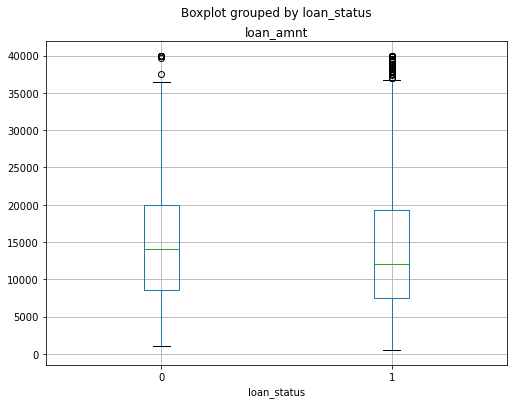

In [60]:
lending_loan_df.boxplot(column='loan_amnt', by='loan_status', figsize=(8,6))

plt.show()

In [86]:
outliers = []

def detect_outliers_zscore(data):
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    
    print(mean, std)
    
    for i in data:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers    # Driver code

sample_outliers = detect_outliers_zscore(lending_loan_df['loan_amnt'])

#print("Outliers from Z-scores method: ", sample_outliers)

14122.061249585673 8357.044371464317


In [88]:
len(sample_outliers) 

184

In [89]:
for i in sample_outliers:
    lending_loan_df.drop(lending_loan_df.index[lending_loan_df['loan_amnt'] == i], inplace=True)
    

In [90]:
lending_loan_df.shape

(395035, 80)

In [97]:
395219 - 184

395035

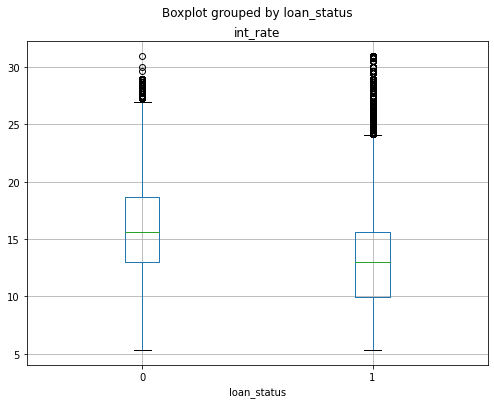

In [61]:
lending_loan_df.boxplot(column='int_rate', by='loan_status', figsize=(8,6))

plt.show()

In [98]:
# PK: It takes some time, more than a minute, before it produces an outcome.

outliers = []

def detect_outliers_zscore(data):
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    
    print(mean, std)
    
    for i in data:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers    # Driver code

sample_outliers = detect_outliers_zscore(lending_loan_df['int_rate'])

#print("Outliers from Z-scores method: ", sample_outliers)

13.642492412097246 4.47262048066645


In [99]:
len(sample_outliers)

752

In [100]:
for i in sample_outliers:
    lending_loan_df.drop(lending_loan_df.index[lending_loan_df['int_rate'] == i], inplace=True)

In [101]:
lending_loan_df.shape

(394283, 80)

In [102]:
395035 - 752

394283

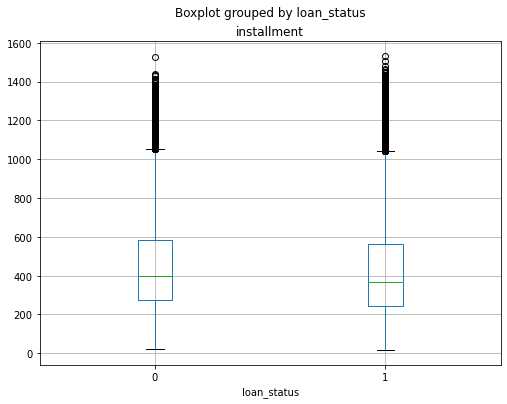

In [62]:
lending_loan_df.boxplot(column='installment', by='loan_status', figsize=(8,6))

plt.show()

In [105]:
outliers = []

def detect_outliers_zscore(data):
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    
    print(mean, std)
    
    for i in data:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers    # Driver code

sample_outliers = detect_outliers_zscore(lending_loan_df['installment'])

#print("Outliers from Z-scores method: ", sample_outliers)

431.3146741300394 249.95611859134198


In [106]:
len(sample_outliers)

4968

In [107]:
# It took a lot of time more than 10 minutes

for i in sample_outliers:
    lending_loan_df.drop(lending_loan_df.index[lending_loan_df['installment'] == i], inplace=True)

In [108]:
lending_loan_df.shape

(389315, 80)

In [109]:
394283 - 4968

389315

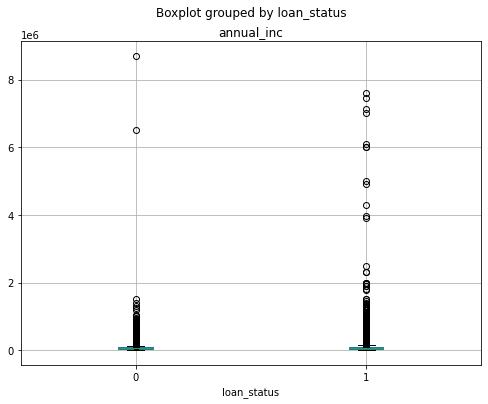

In [63]:
lending_loan_df.boxplot(column='annual_inc', by='loan_status', figsize=(8,6))

plt.show()

In [110]:
outliers = []

def detect_outliers_zscore(data):
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    
    print(mean, std)
    
    for i in data:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers    # Driver code

sample_outliers = detect_outliers_zscore(lending_loan_df['annual_inc'])

#print("Outliers from Z-scores method: ", sample_outliers)

73231.02445086876 59737.45195808144


In [111]:
len(sample_outliers)

2861

In [112]:
# It took a lot of time more than 5 minutes

for i in sample_outliers:
    lending_loan_df.drop(lending_loan_df.index[lending_loan_df['annual_inc'] == i], inplace=True)

In [113]:
lending_loan_df.shape

(386454, 80)

In [114]:
389315 - 2861

386454

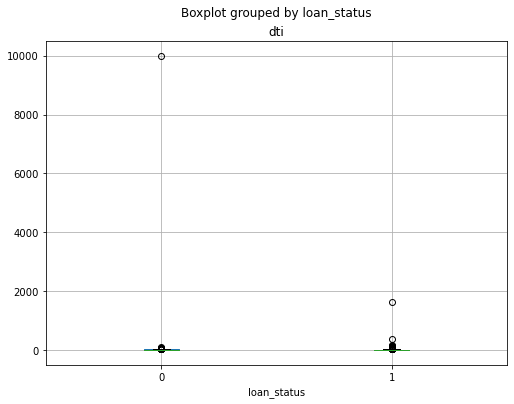

In [64]:
lending_loan_df.boxplot(column='dti', by='loan_status', figsize=(8,6))

plt.show()

In [115]:
outliers = []

def detect_outliers_zscore(data):
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    
    print(mean, std)
    
    for i in data:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers    # Driver code

sample_outliers = detect_outliers_zscore(lending_loan_df['dti'])

#print("Outliers from Z-scores method: ", sample_outliers)

17.451552241663574 18.186465254718645


In [116]:
len(sample_outliers)

11

In [117]:
for i in sample_outliers:
    lending_loan_df.drop(lending_loan_df.index[lending_loan_df['dti'] == i], inplace=True)

In [118]:
lending_loan_df.shape

(386443, 80)

In [119]:
386454 - 11

386443

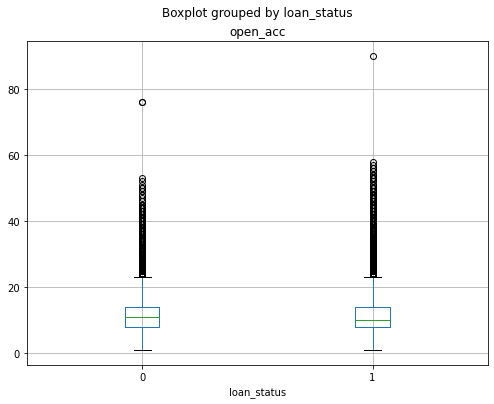

In [65]:
lending_loan_df.boxplot(column='open_acc', by='loan_status', figsize=(8,6))

plt.show()

In [120]:
outliers = []

def detect_outliers_zscore(data):
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    
    print(mean, std)
    
    for i in data:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers    # Driver code

sample_outliers = detect_outliers_zscore(lending_loan_df['open_acc'])

#print("Outliers from Z-scores method: ", sample_outliers)

11.276001894199144 5.107330740611706


In [121]:
len(sample_outliers)

4599

In [122]:
# It took a lot of time more than 10 minutes

for i in sample_outliers:
    lending_loan_df.drop(lending_loan_df.index[lending_loan_df['open_acc'] == i], inplace=True)

In [123]:
lending_loan_df.shape

(381844, 80)

In [124]:
386443 - 4599

381844

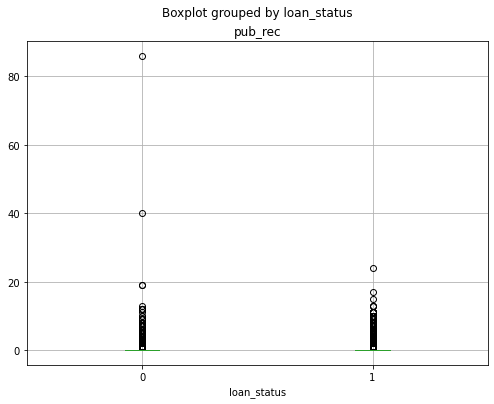

In [66]:
lending_loan_df.boxplot(column='pub_rec', by='loan_status', figsize=(8,6))

plt.show()

In [125]:
outliers = []

def detect_outliers_zscore(data):
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    
    print(mean, std)
    
    for i in data:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers    # Driver code

sample_outliers = detect_outliers_zscore(lending_loan_df['pub_rec'])

#print("Outliers from Z-scores method: ", sample_outliers)

0.1789448046846356 0.5296636422518204


In [126]:
len(sample_outliers)

7672

In [127]:
# It took a lot of time more than 20 minutes

for i in sample_outliers:
    lending_loan_df.drop(lending_loan_df.index[lending_loan_df['pub_rec'] == i], inplace=True)

In [128]:
lending_loan_df.shape

(374172, 80)

In [129]:
381844 - 7672

374172

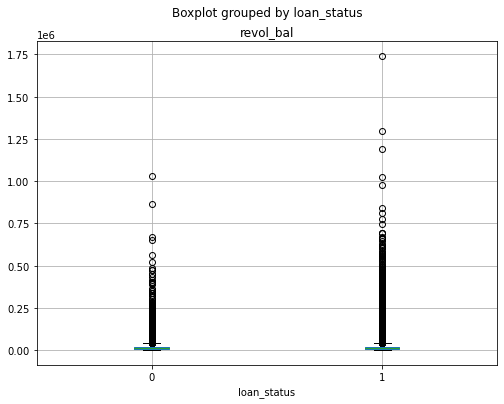

In [67]:
lending_loan_df.boxplot(column='revol_bal', by='loan_status', figsize=(8,6))

plt.show()

In [135]:
outliers = []

def detect_outliers_zscore(data):
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    
    print(mean, std)
    
    for i in data:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers    # Driver code

sample_outliers = detect_outliers_zscore(lending_loan_df['revol_bal'])

#print("Outliers from Z-scores method: ", sample_outliers)

15289.454162791444 17549.074126815456


In [136]:
len(sample_outliers)

5016

In [137]:
# It took a lot of time more than 15 minutes

for i in sample_outliers:
    lending_loan_df.drop(lending_loan_df.index[lending_loan_df['revol_bal'] == i], inplace=True)

In [138]:
lending_loan_df.shape

(369156, 80)

In [139]:
374172 - 5016

369156

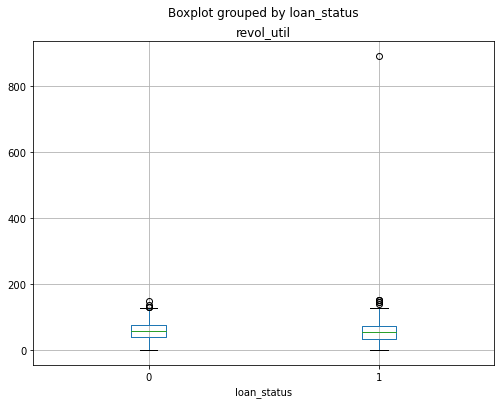

In [68]:
lending_loan_df.boxplot(column='revol_util', by='loan_status', figsize=(8,6))

plt.show()

In [140]:
outliers = []

def detect_outliers_zscore(data):
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    
    print(mean, std)
    
    for i in data:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers    # Driver code

sample_outliers = detect_outliers_zscore(lending_loan_df['revol_util'])

#print("Outliers from Z-scores method: ", sample_outliers)

53.86052476459785 24.39216585700155


In [141]:
len(sample_outliers)

14

In [142]:
for i in sample_outliers:
    lending_loan_df.drop(lending_loan_df.index[lending_loan_df['revol_util'] == i], inplace=True)

In [143]:
lending_loan_df.shape

(369142, 80)

In [144]:
369156 - 14

369142

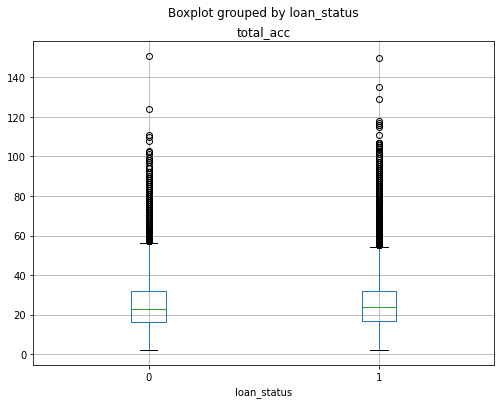

In [69]:
lending_loan_df.boxplot(column='total_acc', by='loan_status', figsize=(8,6))

plt.show()

In [145]:
outliers = []

def detect_outliers_zscore(data):
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    
    print(mean, std)
    
    for i in data:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers    # Driver code

sample_outliers = detect_outliers_zscore(lending_loan_df['total_acc'])

#print("Outliers from Z-scores method: ", sample_outliers)

24.883288815686104 11.392218329871959


In [146]:
len(sample_outliers)

2816

In [147]:
for i in sample_outliers:
    lending_loan_df.drop(lending_loan_df.index[lending_loan_df['total_acc'] == i], inplace=True)

In [148]:
lending_loan_df.shape

(366326, 80)

In [149]:
369142 - 2816

366326

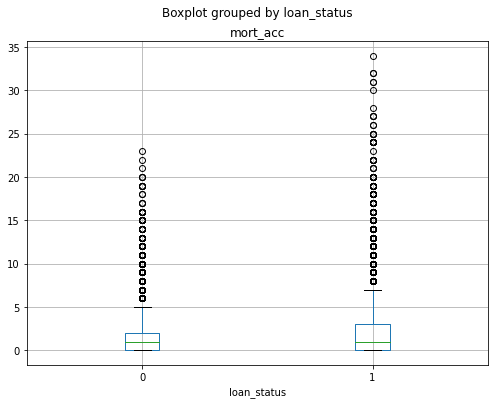

In [70]:
lending_loan_df.boxplot(column='mort_acc', by='loan_status', figsize=(8,6))

plt.show()

In [150]:
outliers = []

def detect_outliers_zscore(data):
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    
    print(mean, std)
    
    for i in data:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers    # Driver code

sample_outliers = detect_outliers_zscore(lending_loan_df['mort_acc'])

#print("Outliers from Z-scores method: ", sample_outliers)

1.7240436114280722 2.0108444988814487


In [151]:
len(sample_outliers)

5632

In [152]:
for i in sample_outliers:
    lending_loan_df.drop(lending_loan_df.index[lending_loan_df['mort_acc'] == i], inplace=True)

In [153]:
lending_loan_df.shape

(360694, 80)

In [154]:
366326 - 5632

360694

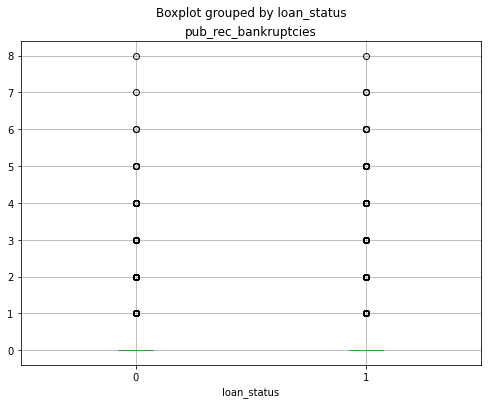

In [71]:
lending_loan_df.boxplot(column='pub_rec_bankruptcies', by='loan_status', figsize=(8,6))

plt.show()

In [155]:
outliers = []

def detect_outliers_zscore(data):
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    
    print(mean, std)
    
    for i in data:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers    # Driver code

sample_outliers = detect_outliers_zscore(lending_loan_df['pub_rec_bankruptcies'])

#print("Outliers from Z-scores method: ", sample_outliers)

0.10616200990313118 0.3080448628955521


In [156]:
len(sample_outliers)

0

In [157]:
for i in sample_outliers:
    lending_loan_df.drop(lending_loan_df.index[lending_loan_df['pub_rec_bankruptcies'] == i], inplace=True)

In [158]:
lending_loan_df.shape

(360694, 80)

In [ ]:
'''
End of Presentation!

'''

In [159]:
print(train[train['dti'] <= 50].shape)
print(train.shape)

(264776, 80)
(264796, 80)


In [ ]:
print(train.shape)

train = train[train['annual_inc'] <= 250000]
train = train[train['dti'] <= 50]
train = train[train['open_acc'] <= 40]
train = train[train['total_acc'] <= 80]
train = train[train['revol_util'] <= 120]
train = train[train['revol_bal'] <= 250000]

print(train.shape)